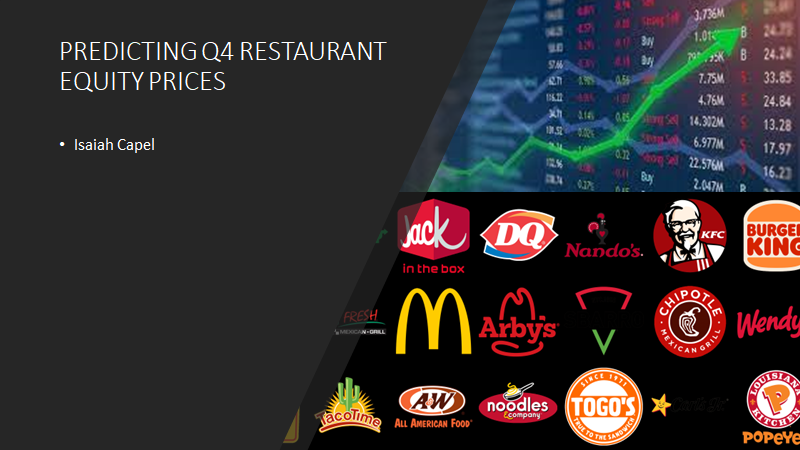

# SUMMARY

This notebook is intended for a hypothetical pension fund looking to cut out the hedge fund or private equity fees by looking to do their own trading. They have asked me to predict which of the top 14 American restaurant stocks will peform best and which will perform worst. 

Of course, examining the restaurant sector without also examining COIVD-19 numbers seems unwise since even 2.5 years in to COVID era, many of these businesses still greatly depend on customers dining at their establishments. Therefore, I used data from the Center for Disease Control(CDC) to predict the COVID numbers for the rest of the year using a Prophet model. Next, I used a Prophet model to predict daily trading volume for each equity. Then, I made an LSTM model of closing prices for all 14 companies over the last 5 years with the exogenous variable of COVID deaths. Then, I made predicitons on that model using the COVID numbers that I predicted. I conlcuded that **Papa Johns, Dominos,  and McDonalds perform best while  Wingstop, Jack in the Box, and Starbucks perform worst.**



# BUSINESS UNDERSTANDING

Currently, the market is in a period of uncertainty. Interest rate hikes, supply chain questions, international conflicts, and a still unrelenting but increasingly silent pandemic hover over the marketplace. For any investors looking to save on fees and do their own trading, these problems making profitable trading a daunting task. The restaurant industry, in particular, is vulnerable to so many of those issues. 

My task is to help navigate this perilous industry by providing you with the restaurant industry equities that will perform best in the remainder of this year and the equities that will perform worse. I am using closing price data from Yahoo Finance. Yahoo Finance is an incredibly rich source of finance data. These predictions should refelct the company's preparedness for the current conditions like a COVID surge. I will recommend stock by measuring which has the highest ROI%:

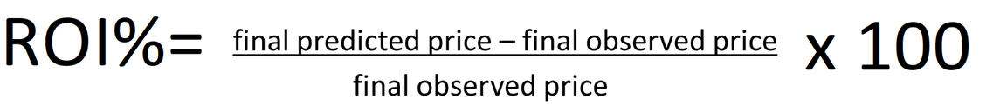

# DATA UNDERSTANDING

To properly model and predict restaurant equity prices in today's world, it's essential to include COVID-19 numbers. There were many "COVID-19 numbers" that I could have used but I decided to use deaths from COVID-19. In another iteration of this work, I may use infection rates but my intuition tells me that people generally worry less about infection nowdays. Basically, increasing infection numbers probably wouldn't alarm consumers but increasing death numbers would deter them from visitng dining establishments in person. 

My COVID-19 death numbers are on a 7 day delay. The reasons are simple: 1:) the CDC takes a week to release results, 2.) the market can take a while to react to COVID numbers. In fact, there is evidence that the market can take very long to react: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8426993/

I used Yahoo Finance site to obtain my price data. I chose to settle on closing price data although intraday price points could be included as well. Each stock in this dataset has, as a prerequisite for examining 5 years of trading, traded for at least 5 years.

**The main metric I use in this notebook is Mean Absolute Percentage Error(MAPE)** because of its universality. I compare between different models and between different stocks. MAPE is great for comparing between very disparate types of values. I will predict prices using multiple models and therefore I need a metric that will provide useful information between models and stocks inside of models. Other metrics like RMSE and MAE would not be helpful in comparing the model's performance on, for example, Chipotle(currently priced in the 4 digits) and Wendy's (trading around 20 dollars). 

# DATA PREPARATION

First things first: I need to import a plethora of libraries and modules:

In [1]:



import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import MeanAbsolutePercentageError 
from tensorflow.keras.optimizers import Adam
from numpy.random import seed
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import timeit
import time
import matplotlib.dates as mdates
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler
import itertools
from pmdarima import auto_arima as pm

from pmdarima import model_selection
from numpy import asarray

import warnings
warnings.filterwarnings('ignore')
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

import statsmodels as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from datetime import datetime

%matplotlib inline
# downloading and opening the excel file with the 5 year data
restaurants = pd. read_excel ("5_year_restaurant_prices.xlsx")
restaurants

,Date,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box
0,2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997
1,2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001
2,2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998
3,2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996
4,2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1322,2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1323,2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1324,2022-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The null values in the latter part of the DataFrame represent future data points that have not yet come but will be predicted. Next, it's important to set the "Date" column to a datetime when using a time series:

In [2]:
restaurants['Date'] =pd.to_datetime(restaurants['Date'])

Next, "Date" must be made the index:

In [3]:
restaurants.index= restaurants['Date']
restaurants.drop(['Date'],axis=1, inplace=True)

Let's do some exploration and check for stationarity:

In [4]:
def dftest_stationarity(data):
    for x in data:
        # Check to see if the p-value ≤ .05. If so, it returns the the stationary zipcodes with associated values.
        if  adfuller(data[x])[1] <=.05: 
            return(x, adfuller(data[x])[0:6])
        

In [5]:
dftest_stationarity(restaurants.iloc[:1267].fillna(0))

('Restaurant Brands Int',
 (-3.2387994131264457,
  0.017845835632014112,
  12,
  1254,
  {'1%': -3.4355754676859886,
   '5%': -2.8638475772391665,
   '10%': -2.5679985805677017},
  3594.1956707712025))

Only Restaurant Brands Int is stationary.

In [6]:
# Checking for stationarity on log scaled data
restaurants_log=np.log(restaurants.iloc[:1267].fillna(0))
dftest_stationarity(restaurants_log)

('Restaurant Brands Int',
 (-3.57451147226002,
  0.006267432248044325,
  16,
  1250,
  {'1%': -3.435592223709696, '5%': -2.8638549702604803, '10%': -2.56800251776},
  -6259.063295187531))

Again, only Restaurant Brands Int is stationary.

In [7]:
# Checking for stationarity on square root data

restaurants_sqrt = np.sqrt(restaurants.iloc[:1267].fillna(0))
dftest_stationarity(restaurants_sqrt)

('Restaurant Brands Int',
 (-3.460165355062584,
  0.009071043465808885,
  12,
  1254,
  {'1%': -3.4355754676859886,
   '5%': -2.8638475772391665,
   '10%': -2.5679985805677017},
  -3080.094514204029))

Once again, only Restaurant Brands International is stationary.

Next, I will import the death numbers into the DataFrame:

# COVID-19 MODELING

Now, let's take a look at the covid death numbers:

In [8]:
ts = pd.read_excel ("7day delay.xlsx")
# Making column 'ds' into a datetime
ts['ds'] =pd.to_datetime(ts['ds'])
ts

,ds,y
0,2020-01-23,0.0
1,2020-01-24,0.0
2,2020-01-25,0.0
3,2020-01-26,0.0
4,2020-01-27,0.0
...,...,...
1050,2022-12-26,NaN
1051,2022-12-27,NaN
1052,2022-12-28,NaN
1053,2022-12-29,NaN


Ok, as you can see, there are no numbers yet for future dates. We will have to predict those.

Let's make a copy of the dataset:

In [9]:

ts_copy=ts.copy(deep=True)

ts_copy['ds'] =pd.to_datetime(ts_copy['ds'])
#ts_copy.index= ts_copy['ds']
#ts_copy.drop(['ds'],axis=1, inplace=True)
ts_copy.index
ts_copy

,ds,y
0,2020-01-23,0.0
1,2020-01-24,0.0
2,2020-01-25,0.0
3,2020-01-26,0.0
4,2020-01-27,0.0
...,...,...
1050,2022-12-26,NaN
1051,2022-12-27,NaN
1052,2022-12-28,NaN
1053,2022-12-29,NaN


Let's use the square root of the death numbers:

In [10]:
ts_sqrt=ts.copy(deep=True)
ts_sqrt['y']=np.sqrt(ts_sqrt['y'])
ts_sqrt.iloc[989:]

,ds,y
989,2022-10-12,NaN
990,2022-10-13,NaN
991,2022-10-14,NaN
992,2022-10-17,NaN
993,2022-10-18,NaN
...,...,...
1050,2022-12-26,NaN
1051,2022-12-27,NaN
1052,2022-12-28,NaN
1053,2022-12-29,NaN


Let's set the index for ts to the 'ds' column because we may have to use this DataFrame later.

In [11]:
ts.set_index('ds', inplace=True)

In [12]:
ts_sqrt

,ds,y
0,2020-01-23,0.0
1,2020-01-24,0.0
2,2020-01-25,0.0
3,2020-01-26,0.0
4,2020-01-27,0.0
...,...,...
1050,2022-12-26,NaN
1051,2022-12-27,NaN
1052,2022-12-28,NaN
1053,2022-12-29,NaN


## XGBoost Regressor

The 1st model I will employ for modeling COVID-19 deaths is XGBoost Regressor. This is actually not a specialized time-series model but is known for being extremely effective at solving almost any task. However, in order to use, I must extract features of the data. Therefore, I will extract the day, month, and year from the date column.

In [13]:
ts_sqrt_clone= ts_sqrt.iloc[:989].copy(deep=True)
ts_sqrt_clone
ts_sqrt_clone.set_index('ds', inplace=True)
ts_sqrt_clone

,y
ds,
2020-01-23,0.000000
2020-01-24,0.000000
2020-01-25,0.000000
2020-01-26,0.000000
2020-01-27,0.000000
...,...
2022-10-05,13.527749
2022-10-06,21.330729
2022-10-07,27.129320


In [14]:
#Extracting the day, year, and month and making them into columns
ts_sqrt_clone['month'] = ts_sqrt_clone.index.month
ts_sqrt_clone['year'] = ts_sqrt_clone.index.year
ts_sqrt_clone['dayofmonth'] = ts_sqrt_clone.index.day


ts_sqrt_clone

,y,month,year,dayofmonth
ds,,,,
2020-01-23,0.000000,1,2020,23
2020-01-24,0.000000,1,2020,24
2020-01-25,0.000000,1,2020,25
2020-01-26,0.000000,1,2020,26
2020-01-27,0.000000,1,2020,27
...,...,...,...,...
2022-10-05,13.527749,10,2022,5
2022-10-06,21.330729,10,2022,6
2022-10-07,27.129320,10,2022,7


In [15]:
# Creating the training set
X_train=ts_sqrt_clone.iloc[:923,1:]
y_train=ts_sqrt_clone.iloc[:923,:1]


In [16]:
y_train

,y
ds,
2020-01-23,0.000000
2020-01-24,0.000000
2020-01-25,0.000000
2020-01-26,0.000000
2020-01-27,0.000000
...,...
2022-07-29,25.278449
2022-07-30,12.247449
2022-07-31,11.000000


In [17]:
# A grid search for optimal parameters
from xgboost import XGBRegressor

from sklearn.model_selection import GridSearchCV
xgb1 = XGBRegressor(random_state=42)
parameters = {'nthread':[4],
              'objective':['reg:squarederror'],
              'learning_rate': [.03, .07], 
              'max_depth': [5, 6, 8],
              'min_child_weight': [4,7],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [100, 200,500]}

xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 5,
                        n_jobs = 10,
                        verbose=True)

xgb_grid.fit(X_train,
         y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
[07:47:19] WARNING: ..\src\learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


-0.36044586302751724
{'colsample_bytree': 0.7, 'learning_rate': 0.03, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'nthread': 4, 'objective': 'reg:squarederror', 'silent': 1, 'subsample': 0.7}


In [18]:
#Fitting on the optimized parameters
model_xgb = XGBRegressor(colsample_bytree= .7, learning_rate=  0.03, max_depth= 6, min_child_weight= 4, subsample= 0.7, n_estimators=100)
model_xgb.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.03, max_delta_step=0,
             max_depth=6, min_child_weight=4, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=4,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [19]:
#Creating a test set
X_test=ts_sqrt_clone.iloc[923:,1:]

y_test=ts_sqrt_clone.iloc[923:,:1]
X_test

,month,year,dayofmonth
ds,,,
2022-08-03,8,2022,3
2022-08-04,8,2022,4
2022-08-05,8,2022,5
2022-08-06,8,2022,6
2022-08-07,8,2022,7
...,...,...,...
2022-10-05,10,2022,5
2022-10-06,10,2022,6
2022-10-07,10,2022,7


In [20]:
xgb_preds=model_xgb.predict(X_train)
print("Train MAPE: %.3f" % (mean_absolute_percentage_error(y_train**2, xgb_preds**2)))
print("MAE Train: %.3f" % (mean_absolute_error(y_train**2,xgb_preds**2)))


Train MAPE: 22950901971408344.000
MAE Train: 379.043


In [21]:
xgb_preds_test=model_xgb.predict(X_test)
print("MAPE Test: %.3f" %(mean_absolute_percentage_error(y_test**2, xgb_preds_test**2)))
print("MAE test: %.3f" % (mean_absolute_error(y_test**2, xgb_preds_test**2)*100))


MAPE Test: 3.118
MAE test: 55256.299


In [22]:
xgb_preds_test

array([27.655396, 27.88299 , 26.9675  , 27.532751, 28.836899, 29.111382,
       27.697245, 28.36855 , 28.564058, 28.105946, 28.298477, 29.430876,
       29.593542, 28.378006, 28.413877, 29.068153, 28.079138, 28.104498,
       29.357445, 29.560907, 28.922943, 29.879116, 29.384491, 28.216076,
       28.203548, 29.602627, 28.77817 , 26.534035, 27.076057, 34.076946,
       33.120293, 34.097782, 34.20866 , 32.775776, 33.118008, 34.02203 ,
       34.29651 , 33.0018  , 33.673103, 33.77278 , 33.322403, 33.65896 ,
       34.73439 , 34.96101 , 33.74548 , 33.78135 , 33.822582, 32.833565,
       32.858925, 34.296284, 34.66495 , 33.778027, 34.524612, 33.703526,
       32.560997, 32.578224, 33.89856 , 33.47875 , 31.151922, 32.462395,
       32.57327 , 31.35017 , 31.648573, 32.492794, 31.821018, 31.92069 ],
      dtype=float32)

XGBoost Regressor COVID MAPE: 311.757
XGBoost Regressor COVID MAE: 552.563


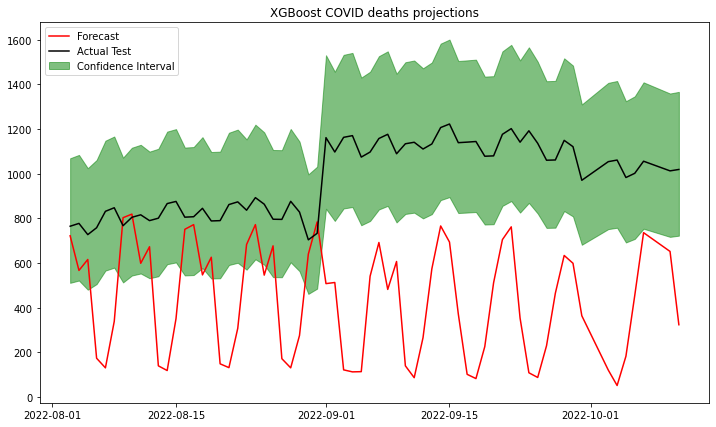

In [23]:
for x in xgb_preds_test:
    interval = 1.96 * xgb_preds_test.std()
    lower, upper = xgb_preds_test - interval, xgb_preds_test + interval
print("XGBoost Regressor COVID MAPE: %.3f" %(mean_absolute_percentage_error(y_test**2, xgb_preds_test**2)*100))
print("XGBoost Regressor COVID MAE: %.3f" %(mean_absolute_error(y_test**2, xgb_preds_test**2)))


plt.figure(figsize=(12,7))
 
plt.plot(ts_sqrt_clone.index[923:], y_test**2, 'r')
plt.plot(ts_sqrt_clone.index[923:], xgb_preds_test**2, 'black')
plt.fill_between(ts_sqrt_clone.index[923:], lower[:66]**2, upper[:66]**2, color="green", alpha=0.5)
plt.legend(['Forecast','Actual Test', 'Confidence Interval'], loc='upper left')
plt.title('XGBoost COVID deaths projections');




Both the MAE and MAPE are very high. Perhaps Prophet will produce better results.

## Prophet

Now let's use Facebook's Prophet to examine the COVID numbers:

In [24]:
ts_sqrt

,ds,y
0,2020-01-23,0.0
1,2020-01-24,0.0
2,2020-01-25,0.0
3,2020-01-26,0.0
4,2020-01-27,0.0
...,...,...
1050,2022-12-26,NaN
1051,2022-12-27,NaN
1052,2022-12-28,NaN
1053,2022-12-29,NaN


In [25]:
from prophet import Prophet

covid_model = Prophet(interval_width=0.95)
covid_model.fit(ts_sqrt.iloc[:923])

Importing plotly failed. Interactive plots will not work.
07:47:21 - cmdstanpy - INFO - Chain [1] start processing
07:47:22 - cmdstanpy - INFO - Chain [1] done processing


Let's look at the results on the training and test data:

Prophet COVID MAPE: 42.887
Prophet COVID MAE: 278.998


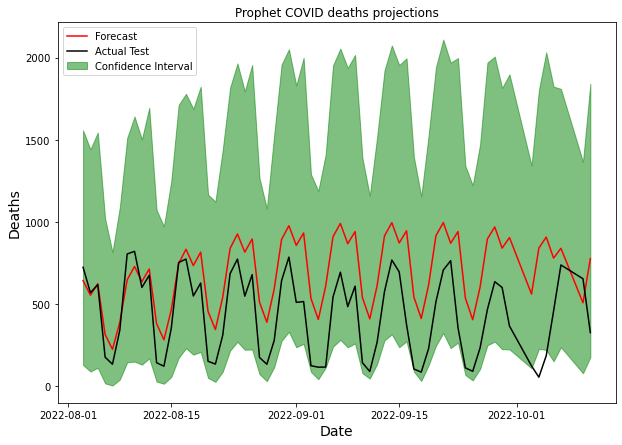

In [26]:
from datetime import datetime
from pandas import DataFrame

from pandas import to_datetime
# Using 66 dates because that is the number of values we need to predict for on the unseen data
future = DataFrame(ts.index[923:989])
future.columns = ['ds']
future['ds']= to_datetime(future['ds'])
forecast =  covid_model.predict(future)
# Calculating the MAPE
# Values from DataFrame 'forecast' must be squared to compare with original data

print("Prophet COVID MAPE: %.3f" % (mean_absolute_percentage_error(forecast['yhat']**2,ts.iloc[923:989] )*100))
print("Prophet COVID MAE: %.3f" % (mean_absolute_error(forecast['yhat']**2,ts.iloc[923:989] )))

prophet_covid_mape=mean_absolute_percentage_error(forecast['yhat']**2,ts.iloc[923:989] )*100


# Values from DataFrame 'forecast' must be squared to compare with original data
plt.figure(figsize=(10,7))

plt.plot(ts.index[923:989],forecast['yhat']**2, 'r')
plt.plot(ts.index[923:989], ts.iloc[923:989], 'black')
plt.fill_between(ts.index[923:989], forecast['yhat_upper']**2, forecast['yhat_lower']**2, color="green", alpha=0.5)
plt.xlabel('Date',fontsize=14)
plt.ylabel('Deaths',fontsize=14)
plt.legend(['Forecast','Actual Test', 'Confidence Interval'], loc='upper left')    
plt.title('Prophet COVID deaths projections')

plt.show()


A 43% MAPE is not ideal. The MAE puts the model performance is more concrete terms. A model that is off by 278 deaths daily isn't ideal especially when COVID-19 deaths are declining nationwide. Therefore, it is necessary to employ another model. Therefore, I will try an LSTM model next.

## LSTM COVID MODEL

In [27]:
#Setting the index to 'ds' so the DataFrame can be used in an LSTM
ts_sqrt.set_index('ds', inplace=True)


In order to use an LSTM, I need to make the values of the DataFrame into a tensor. That's the next task:

In [28]:
# Making the DataFrame values into tensors
def create_dataset(X, y, lag=1):
    #Creating a split into an x(dependent variable) and a y(predicted/independent variable)
    xs,ys = [], []
    #For loop to append on each value of the DataFrame
    for i in range(len(X) - lag):
        tmp = X.iloc[i: i+lag].values
        xs.append(tmp)
        ys.append(y.iloc[i+lag])
    
    return np.array(xs), np.array(ys)

(913, 1) is train shape
Epoch 1/10
91/91 [==============================] - 3s 8ms/step - loss: 185.7310
Epoch 2/10
91/91 [==============================] - 1s 8ms/step - loss: 42.1368
Epoch 3/10
91/91 [==============================] - 1s 8ms/step - loss: 36.8181
Epoch 4/10
91/91 [==============================] - 1s 8ms/step - loss: 50.1128
Epoch 5/10
91/91 [==============================] - 1s 8ms/step - loss: 39.1218
Epoch 6/10
91/91 [==============================] - 1s 8ms/step - loss: 42.9379
Epoch 7/10
91/91 [==============================] - 1s 8ms/step - loss: 40.8758
Epoch 8/10
91/91 [==============================] - 1s 8ms/step - loss: 30.5011
Epoch 9/10
91/91 [==============================] - 1s 8ms/step - loss: 26.8425
Epoch 10/10
3/3 [==============================] - 0s 6ms/step
Deaths LSTM MAPE: 124.129
LSTM COVID MAE: 328.196


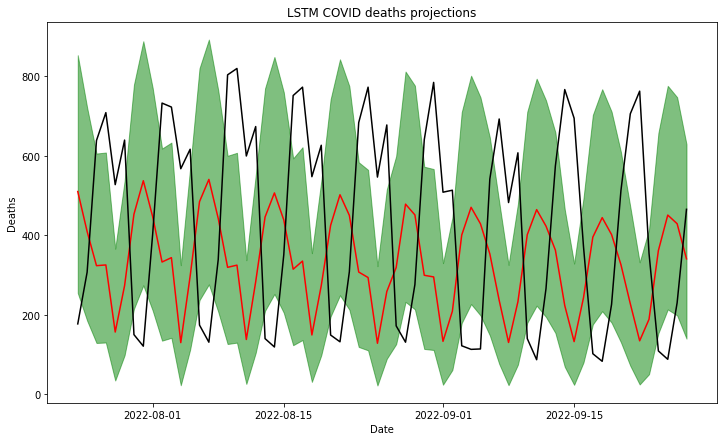

In [29]:
training = ts_sqrt.iloc[:913]
training
next_= ts_sqrt.iloc[913:989].fillna(0)
print(training.shape, 'is train shape')

xtrain, ytrain = create_dataset(training, training.iloc[:,0], 10)
xnext, ynext=create_dataset(next_, next_.iloc[:,0],10)

model = Sequential()
model.add(LSTM(76,activation='relu', input_shape=(xtrain.shape[1], xtrain.shape[2] )))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(xtrain, ytrain,
          epochs=10,
          batch_size=10,
          verbose=1,
          shuffle=False
         )

ypred = model.predict(xnext)

ypred = asarray(ypred)
for x in ypred[:]:
    interval = 1.96 * ypred.std()
    lower, upper = ypred - interval, ypred + interval

plt.figure(figsize=(12,7))
#10 values are lost due to lag. 
plt.plot(ts_sqrt.index[913:979], ypred**2, 'r', label="Predictions")
plt.plot(ts_sqrt.index[913:979], next_.iloc[:66,0]**2, 'black', label="Actual")
plt.fill_between(ts_sqrt.index[913:979], lower[:66, 0]**2, upper[:66, 0]**2, color="green", alpha=0.5)
plt.xlabel("Date")
plt.ylabel("Deaths")
plt.title('LSTM COVID deaths projections')

print("Deaths LSTM MAPE: %.3f" % (mean_absolute_percentage_error(ypred**2, next_.iloc[:66,0]**2)*100))
print("LSTM COVID MAE: %.3f" % (mean_absolute_error(ypred**2, next_.iloc[:66,0]**2)))


That isn't what I was hoping for. That number is too high. The MAPE remains too high. Even running the model multiple times, I obtain results that are too high. It's probably best to use the Prophet model.

Here's how my predictions compare. Note, the predictions at this website are for 4 weeks intervals. 

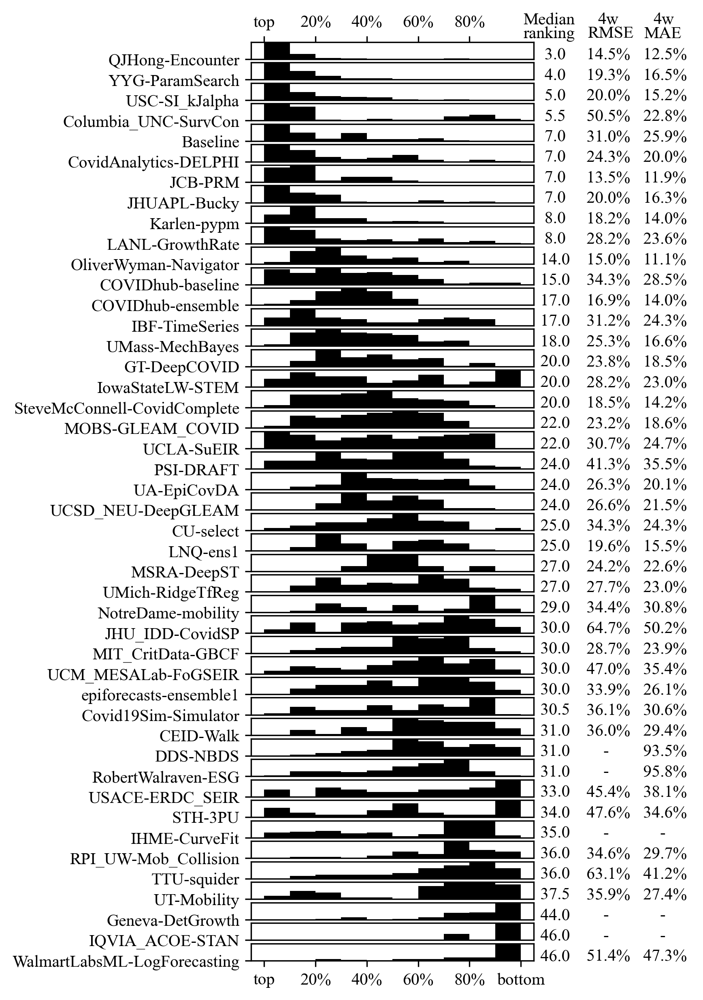

Source:https://qjhong.github.io/

As you can see, my Prophet model is certainly not elite but it also scores beter than some of the other models. Moreover, my model spans 2.5 months while the above models only account for 4 weeks in the future. Therefore, I will use Prophet model since it performed best.

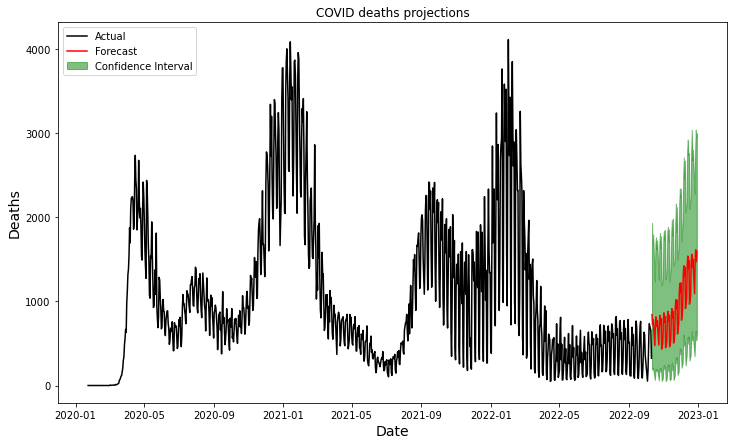

In [30]:
out_of_sample = DataFrame(ts.index[989:1055])
out_of_sample['ds']= to_datetime(out_of_sample['ds'])

predictions=covid_model.predict(out_of_sample)
plt.figure(figsize=(12,7))
plt.plot(ts.index[:989],ts['y'].iloc[:989], 'black')

plt.plot(ts.index[989:1055],predictions['yhat']**2, 'r')
plt.fill_between(ts.index[989:1055], predictions['yhat_upper']**2, predictions['yhat_lower']**2, color="green", alpha=0.5)
plt.xlabel('Date',fontsize=14)
plt.ylabel('Deaths',fontsize=14)
plt.legend(['Actual','Forecast','Confidence Interval'], loc='upper left')    
plt.title('COVID deaths projections')

plt.show()

**OK, now that I have predictions, let's model the Volume**

## Volume

In [31]:
volume = pd. read_excel ("volume.xlsx")
volume['ds'] =pd.to_datetime(volume['ds'])
#volume_2=volume.copy(deep=True)
#volume.index= volume['ds']
#volume.drop(['ds'],axis=1, inplace=True)
volume

,ds,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box
0,2017-09-27,3.915900e+06,8.671300e+06,1.293000e+06,3.166400e+06,1.088200e+06,3.086200e+06,5.868000e+05,4.666800e+06,346500.000000,448200.000000,392100.000000,817900.000000,1.199300e+06,4.353000e+05
1,2017-09-28,4.210200e+06,7.607500e+06,6.120000e+05,2.410200e+06,7.079000e+05,2.289300e+06,6.568000e+05,1.741100e+06,239100.000000,378100.000000,238300.000000,715100.000000,7.286000e+05,4.948000e+05
2,2017-09-29,3.670100e+06,1.194440e+07,1.195800e+06,1.942300e+06,1.039400e+06,2.144800e+06,6.363000e+05,1.758500e+06,433800.000000,407800.000000,401900.000000,530700.000000,8.496000e+05,1.006200e+06
3,2017-10-02,2.407000e+06,5.956000e+06,1.691400e+06,2.155000e+06,8.448000e+05,1.535200e+06,1.196900e+06,1.840300e+06,749900.000000,375400.000000,309300.000000,440700.000000,5.912000e+05,4.426000e+05
4,2017-10-03,2.188400e+06,6.137100e+06,8.336000e+05,1.980200e+06,1.013000e+06,1.740700e+06,1.255000e+06,2.369300e+06,420400.000000,821500.000000,213600.000000,419600.000000,1.236200e+06,4.925000e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,2022-12-26,2.615291e+06,1.433990e+07,1.048593e+05,1.851928e+06,7.488205e+05,9.008185e+05,1.703727e+05,1.776652e+06,541714.335136,462747.267095,324170.544925,675099.102624,1.823649e+06,3.752781e+05
1322,2022-12-27,2.619772e+06,1.429493e+07,6.098673e+04,1.838737e+06,7.390341e+05,1.000358e+06,2.166956e+05,1.282583e+06,514815.351659,306900.261346,284005.153904,674557.163487,1.761315e+06,4.157111e+05
1323,2022-12-28,2.847038e+06,1.506976e+07,3.344814e+04,1.948105e+06,6.745484e+05,9.782305e+05,1.378586e+05,1.357624e+06,583331.129013,310455.352494,297907.509905,715069.081547,1.926319e+06,3.426320e+05
1324,2022-12-29,2.728289e+06,1.382196e+07,-7.998442e+03,2.465052e+06,4.261893e+05,1.734989e+06,-1.949195e+05,2.021969e+06,385588.912680,43502.581107,342752.626192,634945.305028,1.659927e+06,1.542672e+05


In [32]:
1327-120

1207

07:47:37 - cmdstanpy - INFO - Chain [1] start processing
07:47:37 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 24.575
Prophet Volume MAE: 507627.920


07:47:38 - cmdstanpy - INFO - Chain [1] start processing
07:47:39 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 34.810
Prophet Volume MAE: 3706251.827


07:47:39 - cmdstanpy - INFO - Chain [1] start processing
07:47:40 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 563.479
Prophet Volume MAE: 150259.632


07:47:41 - cmdstanpy - INFO - Chain [1] start processing
07:47:41 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 30.739
Prophet Volume MAE: 447382.451


07:47:42 - cmdstanpy - INFO - Chain [1] start processing
07:47:43 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 44.728
Prophet Volume MAE: 444731.489


07:47:44 - cmdstanpy - INFO - Chain [1] start processing
07:47:44 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 60.838
Prophet Volume MAE: 422156.233


07:47:45 - cmdstanpy - INFO - Chain [1] start processing
07:47:45 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 470.560
Prophet Volume MAE: 530081.782


07:47:47 - cmdstanpy - INFO - Chain [1] start processing
07:47:47 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 43.254
Prophet Volume MAE: 891171.578


07:47:48 - cmdstanpy - INFO - Chain [1] start processing
07:47:48 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 70.348
Prophet Volume MAE: 312058.451


07:47:49 - cmdstanpy - INFO - Chain [1] start processing
07:47:50 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 52.612
Prophet Volume MAE: 209612.844


07:47:51 - cmdstanpy - INFO - Chain [1] start processing
07:47:51 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 55.002
Prophet Volume MAE: 145844.210


07:47:52 - cmdstanpy - INFO - Chain [1] start processing
07:47:52 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 29.308
Prophet Volume MAE: 216113.858


07:47:54 - cmdstanpy - INFO - Chain [1] start processing
07:47:54 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 35.025
Prophet Volume MAE: 678417.312


07:47:55 - cmdstanpy - INFO - Chain [1] start processing
07:47:55 - cmdstanpy - INFO - Chain [1] done processing


Prophet Volume MAPE: 147.450
Prophet Volume MAE: 206478.346


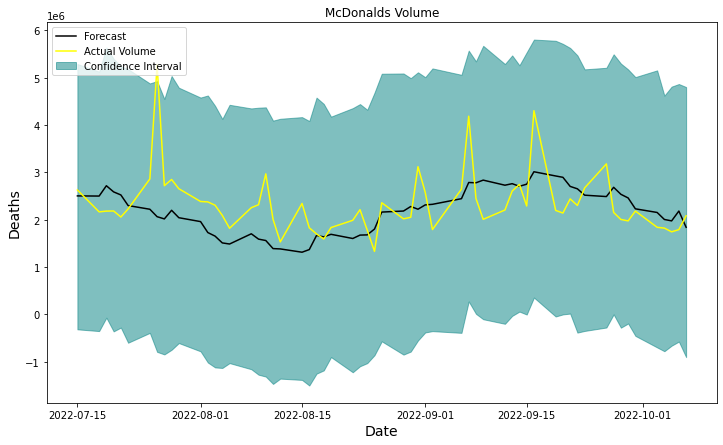

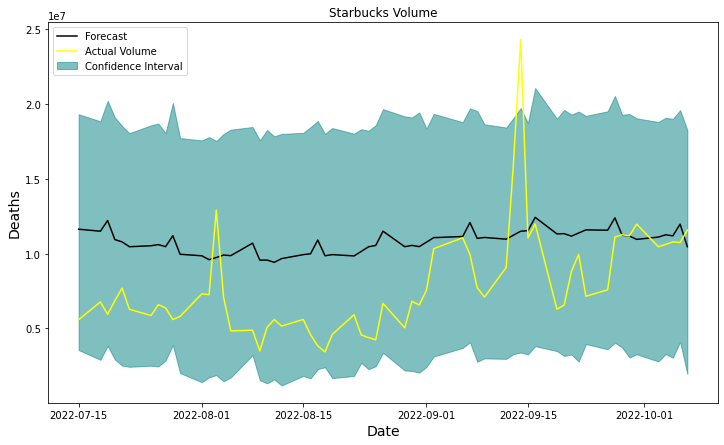

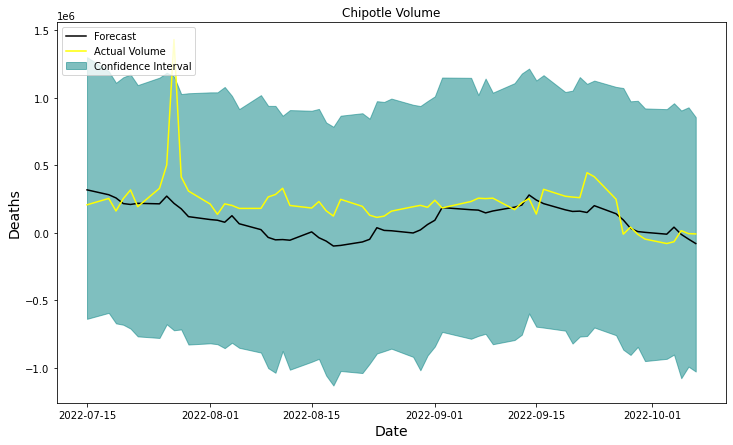

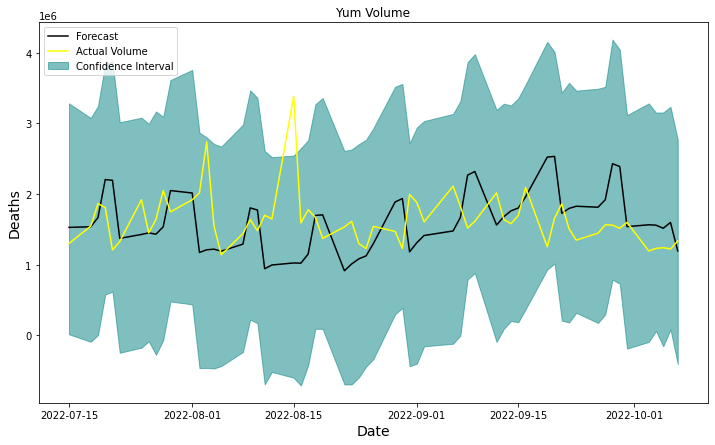

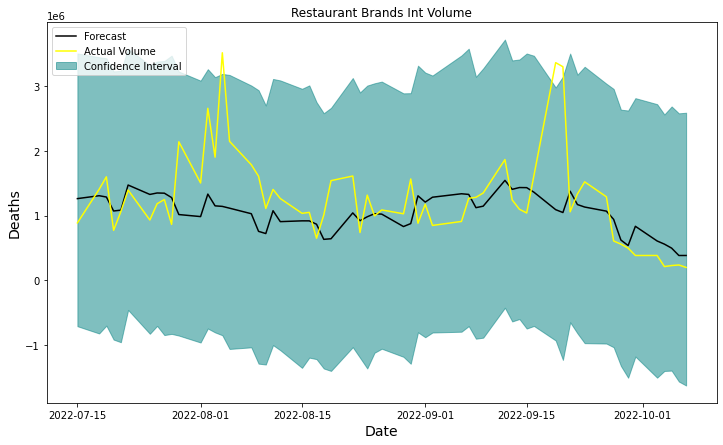

...

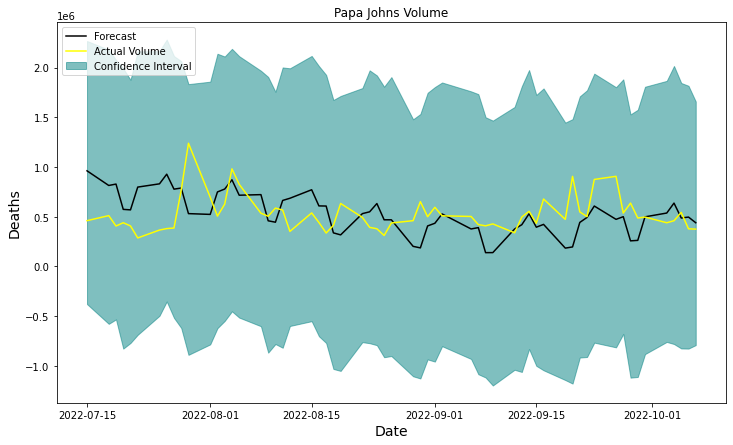

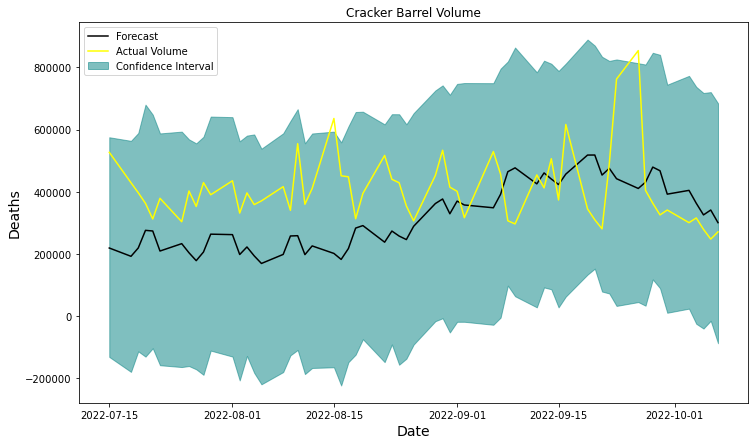

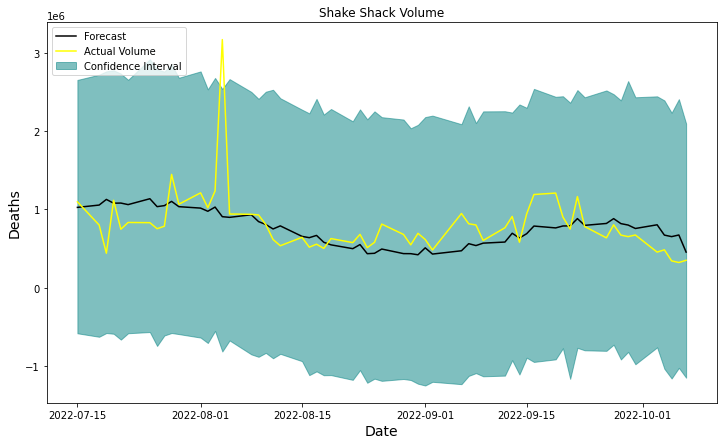

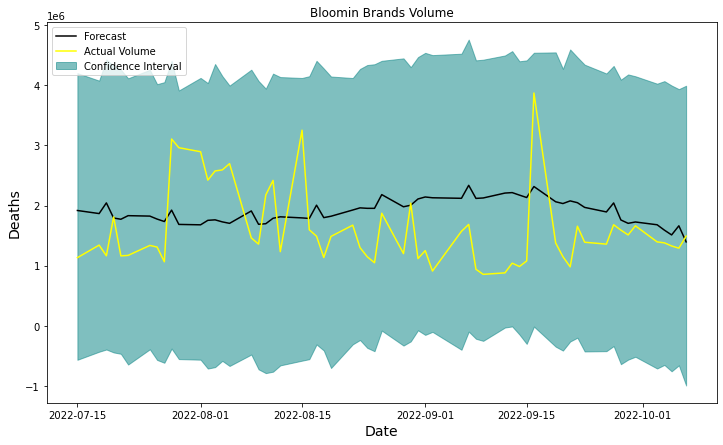

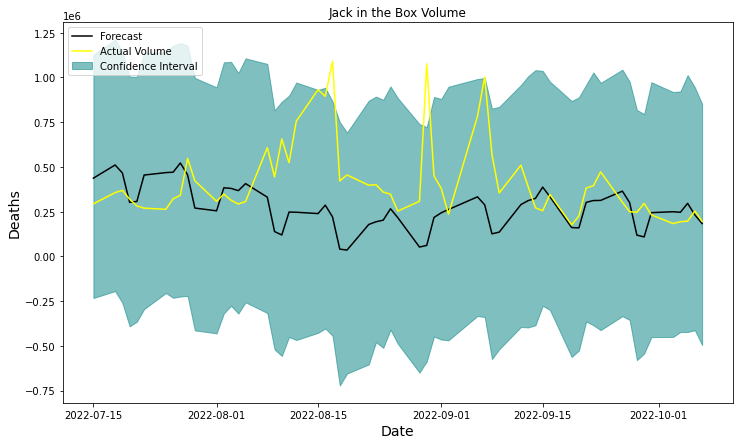

In [33]:

volume_copy=volume.copy(deep=True)
volume_copy.set_index('ds', inplace=True)
#Log transforming volume numbers
volume_copy=np.log(volume_copy)
past_vol=volume.iloc[:, 1:]
prophet_volume=dict()
future_volume=dict()

for x in past_vol:
    series= past_vol[x]
    vol_ds=volume['ds'].iloc[:1207]
    volume_num=pd.concat([vol_ds, series], axis=1)
    volume_num.rename(columns={ series.name:"y"}, inplace=True)
    volume_num['ds'] =pd.to_datetime( volume_num['ds'])

    volume_model = Prophet(interval_width=0.95)
    volume_model.fit(volume_num.iloc[:1181])
    future_vol = DataFrame(volume_copy.index[1207:1267])
    future_vol.columns = ['ds']
    future_vol['ds']= to_datetime(future['ds'])
    forecast =  volume_model.predict(future_vol)
    # Calculating the MAPE
    # Values from DataFrame 'forecast' must be squared to compare with original data

    print("Prophet Volume MAPE: %.3f" % (mean_absolute_percentage_error(forecast['yhat'],volume_num['y'].iloc[1207:1267] )*100))
    print("Prophet Volume MAE: %.3f" % (mean_absolute_error(forecast['yhat'],volume_num['y'].iloc[1207:1267] )))

    prophet_volume[x]=mean_absolute_percentage_error(forecast['yhat'],volume_num['y'].iloc[1207:1267] )*100

    # Values from DataFrame 'forecast' must be squared to compare with original data
    plt.figure(figsize=(12,7))

    plt.plot(volume_copy.index[1207:1267],forecast['yhat'], 'black')
    plt.plot(volume_copy.index[1207:1267], volume_num['y'].iloc[1207:1267], 'yellow')
    plt.fill_between(volume_copy.index[1207:1267], forecast['yhat_upper'], forecast['yhat_lower'], color="teal", alpha=0.5)
    plt.xlabel('Date',fontsize=14)
    plt.ylabel('Deaths',fontsize=14)
    plt.legend(['Forecast','Actual Volume', 'Confidence Interval'], loc='upper left')    
    plt.title(f'{x} Volume')
    # For out of sample predictions
    #out_of_sample_1 = DataFrame(volume_copy.index[1258:])
    #out_of_sample_1['ds']= to_datetime(out_of_sample_1['ds'])


    #predictions_1=volume_model.predict(out_of_sample_1)
    #future_volume[x]=predictions_1['yhat']
    
    #plt.figure(figsize=(12,7))

    #plt.plot(volume.index[1258:],predictions_1['yhat'], 'red')
    #plt.fill_between(volume.index[1258:], predictions_1['yhat_upper'], predictions_1['yhat_lower'], color="black", alpha=0.5)
    #plt.xlabel('Date',fontsize=14)
    #plt.ylabel('Deaths',fontsize=14)
    #plt.legend(['Forecast','Confidence Interval'], loc='upper left')    
    #plt.title(f'{x} Future Volume')
    #plt.show()

    


In [34]:
from operator import itemgetter, attrgetter
prop_vol_errors= sorted(prophet_volume.items(), key=itemgetter(0), reverse=True)
prop_vol_mapes= pd.DataFrame(prop_vol_errors)
prop_vol_mapes.rename( columns={0 :'Stock', 1:'Prophet Volume MAPEs'}, inplace=True )
prop_vol_mapes

,Stock,Prophet Volume MAPEs
0,Yum,30.738558
1,Wingstop,70.347978
2,Wendys,43.254390
3,Starbucks,34.810300
4,Shake Shack,29.307992
5,Restaurant Brands Int,44.728348
6,Papa Johns,52.611679
7,McDonalds,24.574718
8,Jack in the Box,147.450034
9,Dominos,470.559621


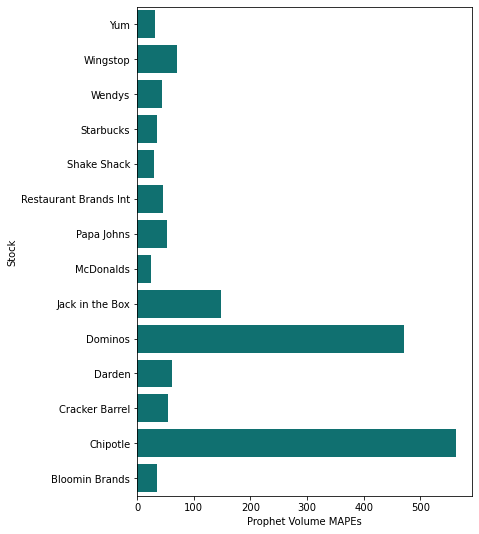

In [35]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='Prophet Volume MAPEs',y='Stock', data=prop_vol_mapes, color="teal");

In [36]:
preds=dict()
mapes_lstm_vol=dict()
for x in volume_copy:

    training =  volume_copy.iloc[:1198].fillna(0)
    next_=  volume_copy.iloc[1198:1265].fillna(0)
    future_vol=volume_copy.iloc[1265:1327].fillna(0)

    xtrain, ytrain = create_dataset(training, training.iloc[:,0], 2)
    xnext, ynext=create_dataset(next_, next_.iloc[:,0],2)
    xfuture_vol, yfuture_vol=create_dataset(future_vol, future_vol.iloc[:,0],2)
    model = Sequential()
    model.add(LSTM(70,activation='relu', input_shape=(xtrain.shape[1], xtrain.shape[2] )))
    model.add(Dense(25))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error", optimizer="adam")

    model.fit(xtrain, ytrain,epochs=10,batch_size=10, verbose=1,shuffle=False)

    ypred_vol= model.predict(xnext)
    #Predicting for future values. LSTM is a stochastic process so results will vary each time.
    future_vol_pred=model.predict(xfuture_vol)

    vol_series = pd.Series(future_vol_pred[:,0])
    vol_series
    preds[x]=vol_series
    #for x in ypred_vol[:]:
        #interval = 1.96 * ypred_vol.std()
        #lower, upper = ypred_vol - interval, ypred_vol + interval
    

    #plt.figure(figsize=(12,7))
    #10 values are lost due to lag. 
    #plt.plot(volume.index[1240:], np.e**ypred_vol, 'r', label="Predictions")
    #plt.plot(volume.index[1240:], np.e**next_.iloc[:62,0], 'black', label="Actual")
    #plt.fill_between(volume.index[1240:1302], np.e**lower[:62, 0]**2, np.e**upper[:62, 0]**2, color="green", alpha=0.5)
    #plt.xlabel("Date")
    ##plt.ylabel("Volume") 
    #plt.title('LSTM Volume')

    print(x, 'Volume MAPE', (mean_absolute_percentage_error(ypred_vol,next_.iloc[:65,0])*100))
    print(x,  'Volume MAE', (mean_absolute_error(ypred_vol, next_.iloc[:65,0])))
    mapes_lstm_vol[x]=mean_absolute_percentage_error(ypred_vol,next_.iloc[:65,0])*100

Epoch 1/10
120/120 [==============================] - 3s 4ms/step - loss: 5.9893
Epoch 2/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2533
Epoch 3/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2706
Epoch 4/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2731
Epoch 5/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2602
Epoch 6/10
120/120 [==============================] - 1s 5ms/step - loss: 0.2432
Epoch 7/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2275
Epoch 8/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2143
Epoch 9/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2036
Epoch 10/10
2/2 [==============================] - 0s 5ms/step
McDonalds Volume MAPE 4.7304415814048735
McDonalds Volume MAE 0.6388293607623564
Epoch 1/10
120/120 [==============================] - 3s 4ms/step - loss: 7.7839
Epoch 2/10
120/120 [==========================

Epoch 4/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1722
Epoch 5/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1648
Epoch 6/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1571
Epoch 7/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1517
Epoch 8/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1481
Epoch 9/10
120/120 [==============================] - 1s 4ms/step - loss: 0.1457
Epoch 10/10
2/2 [==============================] - 0s 6ms/step
Wingstop Volume MAPE 1.3473072599582319
Wingstop Volume MAE 0.1946610503141665
Epoch 1/10
120/120 [==============================] - 3s 4ms/step - loss: 8.8370
Epoch 2/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2637
Epoch 3/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2942
Epoch 4/10
120/120 [==============================] - 1s 4ms/step - loss: 0.2751
Epoch 5/10
120/120 [============================

In [37]:
from operator import itemgetter, attrgetter
lstm_vol_errors= sorted(mapes_lstm_vol.items(), key=itemgetter(0), reverse=True)
lstm_vol_mapes= pd.DataFrame(lstm_vol_errors)
lstm_vol_mapes.rename( columns={0 :'Stock', 1:'LSTM Volume MAPEs'}, inplace=True )
lstm_vol_mapes

,Stock,LSTM Volume MAPEs
0,Yum,2.368357
1,Wingstop,1.347307
2,Wendys,2.628556
3,Starbucks,1.223519
4,Shake Shack,2.381913
5,Restaurant Brands Int,2.197539
6,Papa Johns,3.863889
7,McDonalds,4.730442
8,Jack in the Box,2.054363
9,Dominos,1.832663


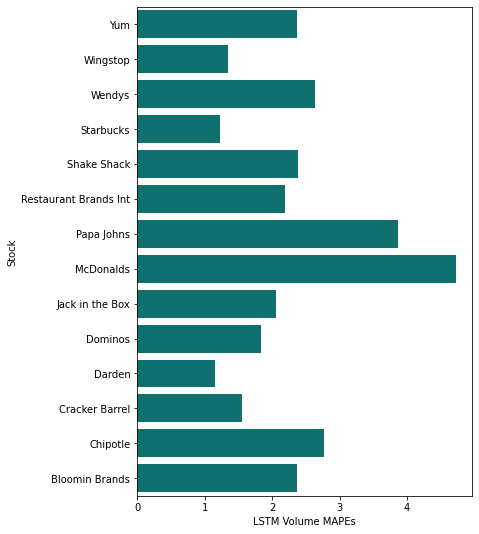

In [38]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='LSTM Volume MAPEs',y='Stock', data=lstm_vol_mapes, color="teal");

In [39]:
preds_vol=pd.DataFrame.from_dict(preds)


Making both the predictions and the 'volume_copy' into Excel. The results in the preds_vol.xlsx were from a previous LSTM but again LSTM is stochastic and will produce different results every time.

In [40]:
#Making DataFrame into Excel
#preds_vol.to_excel("preds_vol.xlsx")
#volume_copy.to_excel("volume_copy.xlsx")


In [41]:
vol_full = pd. read_excel ("volume_copy.xlsx")
vol_full

,ds,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box
0,2017-09-27,15.180556,15.975529,14.072476,14.968106,13.900036,14.942451,13.282439,15.355984,12.755638,13.012995,12.879272,13.614495,13.997249,12.983791
1,2017-09-28,15.253021,15.844645,13.324488,14.695220,13.470058,14.643757,13.395135,14.370028,12.384637,12.842914,12.381286,13.480178,13.498880,13.111909
2,2017-09-29,15.115729,16.295773,13.994326,14.479383,13.854154,14.578557,13.363425,14.379972,12.980339,12.918532,12.903959,13.181952,13.652521,13.821691
3,2017-10-02,14.693892,15.599910,14.341067,14.583301,13.646855,14.244171,13.995245,14.425439,13.527695,12.835747,12.642067,12.996120,13.289910,13.000422
4,2017-10-03,14.598681,15.629863,13.633509,14.498708,13.828427,14.369798,14.042646,14.678105,12.948962,13.618887,12.271860,12.947057,14.027553,13.107250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,2022-12-26,14.527125,14.007763,14.476140,14.301470,14.250830,14.404818,14.283086,14.358101,14.099237,14.393188,14.581648,14.151305,14.329449,14.008760
1322,2022-12-27,14.459140,14.004930,14.463622,14.341323,14.332242,14.411596,14.306379,14.389453,14.167661,14.365440,14.598057,14.140480,14.336628,13.992701
1323,2022-12-28,14.422832,14.058701,14.502076,14.292338,14.322409,14.449010,14.287581,14.331547,14.200298,14.433408,14.569805,14.103364,14.309126,13.976744
1324,2022-12-29,14.391884,13.967605,14.452594,14.264028,14.219143,14.363514,14.188259,14.254416,14.022746,14.357587,14.585541,14.064636,14.250428,13.898216


Ok, I saved the results and put it in an Excel file. I'll use the results later.

# PRICE MODELING

## Auto-Arima

The 1st model I will employ is an Auto-Arima model.

Let's merge the price data with the death data:

In [42]:
# Merge on restaurants index.
merged=restaurants.merge(ts, how='left',left_on=restaurants.index, right_on=ts.index)
#Filling any null with 0.
merged['y'].fillna(0, inplace=True)
#Renaming the "y" column in ts_copy with deaths
merged.rename(columns={"y": "deaths", "key_0":"Dates"}, inplace=True)
merged.set_index('Dates', inplace=True)
merged

,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,deaths
Dates,,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,0.0
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,0.0
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,0.0
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,0.0
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


Making a copy and setting its index to 'Dates':

In [43]:
merged_copy=merged.copy(deep=True)
#merged_copy.set_index('Dates', inplace=True)
merged_copy

,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,deaths
Dates,,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,0.0
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,0.0
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,0.0
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,0.0
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [44]:
# A Dataframe with no future values
merged_insample=merged.iloc[:1267,:]
#merged_insample.set_index('Dates', inplace=True)
merged_insample.asfreq('d').index
merged_insample

,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,deaths
Dates,,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,0.0
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,0.0
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,0.0
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,0.0
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-03,235.340000,85.620000,1468.160000,109.110000,54.110000,125.410000,316.440000,18.95,123.030000,73.450000,91.410000,45.630000,18.440000,72.630000,121.0
2022-10-04,238.500000,88.510000,1524.200000,111.410000,55.480000,132.220000,330.610000,19.47,128.760000,75.560000,97.150000,46.560000,19.600000,77.130000,52.0
2022-10-05,239.090000,90.120000,1495.860000,112.330000,55.130000,133.100000,335.130000,19.56,137.650000,74.430000,96.450000,46.460000,19.890000,77.700000,183.0


In [45]:
vol_full.fillna(method='bfill')

,ds,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box
0,2017-09-27,15.180556,15.975529,14.072476,14.968106,13.900036,14.942451,13.282439,15.355984,12.755638,13.012995,12.879272,13.614495,13.997249,12.983791
1,2017-09-28,15.253021,15.844645,13.324488,14.695220,13.470058,14.643757,13.395135,14.370028,12.384637,12.842914,12.381286,13.480178,13.498880,13.111909
2,2017-09-29,15.115729,16.295773,13.994326,14.479383,13.854154,14.578557,13.363425,14.379972,12.980339,12.918532,12.903959,13.181952,13.652521,13.821691
3,2017-10-02,14.693892,15.599910,14.341067,14.583301,13.646855,14.244171,13.995245,14.425439,13.527695,12.835747,12.642067,12.996120,13.289910,13.000422
4,2017-10-03,14.598681,15.629863,13.633509,14.498708,13.828427,14.369798,14.042646,14.678105,12.948962,13.618887,12.271860,12.947057,14.027553,13.107250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,2022-12-26,14.527125,14.007763,14.476140,14.301470,14.250830,14.404818,14.283086,14.358101,14.099237,14.393188,14.581648,14.151305,14.329449,14.008760
1322,2022-12-27,14.459140,14.004930,14.463622,14.341323,14.332242,14.411596,14.306379,14.389453,14.167661,14.365440,14.598057,14.140480,14.336628,13.992701
1323,2022-12-28,14.422832,14.058701,14.502076,14.292338,14.322409,14.449010,14.287581,14.331547,14.200298,14.433408,14.569805,14.103364,14.309126,13.976744
1324,2022-12-29,14.391884,13.967605,14.452594,14.264028,14.219143,14.363514,14.188259,14.254416,14.022746,14.357587,14.585541,14.064636,14.250428,13.898216


In [46]:
vol_full.set_index('ds', inplace=True)

In [47]:

error_dict_percent=dict();
def stonks(stocks):
    # train size= 1-(138/1267)=0.8910812943962115
    train, test = model_selection.train_test_split(stocks, train_size=1129  )
    #Making a DataFrame with both the volume and the death numbers
    
    volumex=vol_full[x].iloc[:1267].to_frame()
    #volumex.index=vol_full[:1267].index
    deaths_frame=merged_insample['deaths'].iloc[:1267].to_frame()
    exog_vars=volumex.merge(deaths_frame, how='left',left_on=volumex.index, right_on=deaths_frame.index)
    exog_vars.set_index('key_0', inplace=True)
    # Auto_arima from: https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html
    # Default criterion is AIC.
    model_0 = pm(train, X= exog_vars.iloc[:1129], start_p=1, start_q=1, start_P=1, start_Q=1,
                 max_p=5, max_q=5, max_P=5, max_Q=5, seasonal=True,stepwise=True, suppress_warnings=True, 
                 D=5, max_D=5,error_action='ignore')
    #printing model summary
    print(model_0.summary())
    #Creating the predictions. 
    #conf_int returns confidence level at 95% level.
    
    preds_0, conf_int = model_0.predict(n_periods=69, X= (exog_vars.iloc[1129:1198]), 
                                        return_conf_int=True)
    
    
    #Print the errors:

    print("Test MAPE: %.3f" % np.sqrt(mean_absolute_percentage_error(test.iloc[:69], preds_0)*100))
    print("Test MAE: %.3f" % (mean_absolute_error(test.iloc[:69], preds_0)))
    percent_error=mean_absolute_percentage_error(test.iloc[:69], preds_0)*100

   

    plt.figure(figsize=(12,6))
    plt.plot(merged_insample.index[:1129], train)
    plt.plot(merged_insample.index[1129 :1198], test.iloc[:69])
    plt.plot(merged_insample.index[1129 :1198], preds_0)
    plt.fill_between(merged_insample.index[1129 :1198], conf_int[:, 0], conf_int[:, 1], color="purple", alpha=0.5)
    plt.xlabel('Year',fontsize=14)
    plt.ylabel('Home Value',fontsize=14)
    plt.legend(['Train','Test', 'Predictions', 'Confidence Interval'], loc='upper left')    
    plt.title(f'{stocks.name} Price')
    plt.ticklabel_format(axis='y',style='plain',useOffset=False)
    plt.show()
    error_dict_percent[stocks.name]=percent_error

    

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(5, 1, 0)   Log Likelihood               -2739.980
Date:                Fri, 04 Nov 2022   AIC                           5495.959
Time:                        07:50:17   BIC                           5536.185
Sample:                             0   HQIC                          5511.158
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
McDonalds     -0.5071      0.211     -2.408      0.016      -0.920      -0.094
deaths     -6.556e-05      0.000     -0.205      0.838      -0.001       0.001
ar.L1         -0.1283      0.018     -7.128      0.0

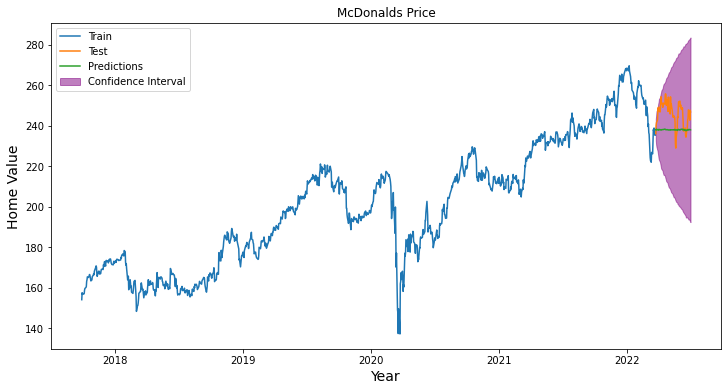

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(1, 1, 0)   Log Likelihood               -2019.627
Date:                Fri, 04 Nov 2022   AIC                           4047.254
Time:                        07:50:25   BIC                           4067.367
Sample:                             0   HQIC                          4054.854
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Starbucks     -0.3688      0.084     -4.406      0.000      -0.533      -0.205
deaths      1.788e-05      0.000      0.138      0.890      -0.000       0.000
ar.L1         -0.1044      0.017     -6.302      0.0

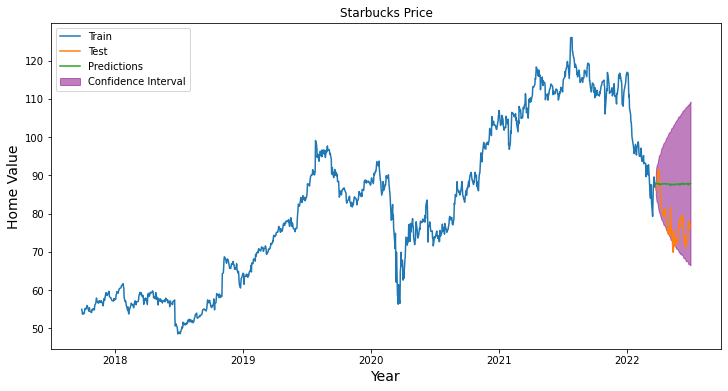

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(1, 1, 0)   Log Likelihood               -5067.441
Date:                Fri, 04 Nov 2022   AIC                          10144.883
Time:                        07:50:30   BIC                          10170.024
Sample:                             0   HQIC                         10154.382
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0537      0.766      1.376      0.169      -0.447       2.554
Chipotle       0.9232      1.372      0.673      0.501      -1.767       3.613
deaths         0.0051      0.001      3.625      0.0

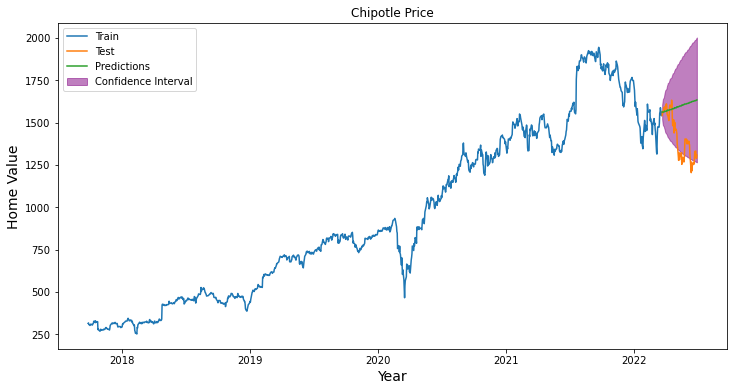

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2028.044
Date:                Fri, 04 Nov 2022   AIC                           4062.088
Time:                        07:50:33   BIC                           4077.173
Sample:                             0   HQIC                          4067.788
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Yum           -0.0496      0.101     -0.494      0.621      -0.247       0.147
deaths      7.354e-05      0.000      0.523      0.601      -0.000       0.000
sigma2         2.1339      0.037     57.390      0.0

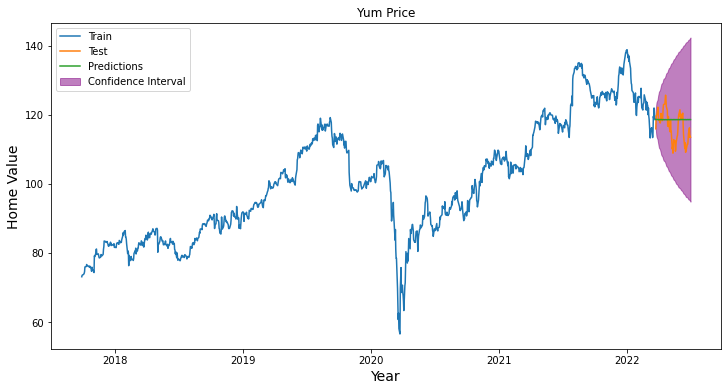

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -1659.761
Date:                Fri, 04 Nov 2022   AIC                           3325.521
Time:                        07:50:35   BIC                           3340.606
Sample:                             0   HQIC                          3331.221
                               - 1129                                         
Covariance Type:                  opg                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Restaurant Brands Int    -0.0612      0.058     -1.061      0.289      -0.174       0.052
deaths                 5.719e-05      0.000      0.506      0.613      -0.000       0.000
sigma2  

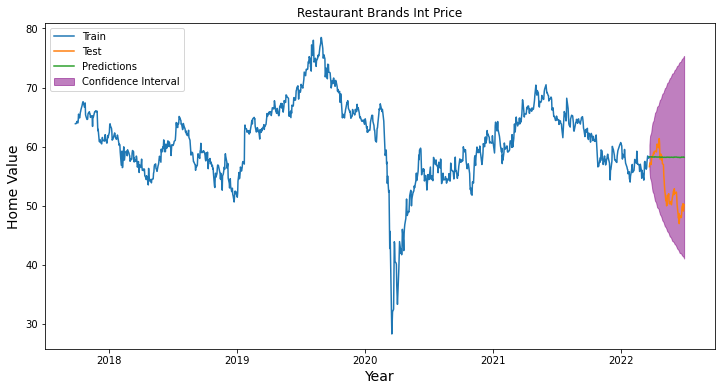

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2633.630
Date:                Fri, 04 Nov 2022   AIC                           5273.260
Time:                        07:50:38   BIC                           5288.345
Sample:                             0   HQIC                          5278.960
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Darden        -0.4717      0.165     -2.867      0.004      -0.794      -0.149
deaths         0.0002      0.000      0.675      0.500      -0.000       0.001
sigma2         6.2444      0.118     53.012      0.0

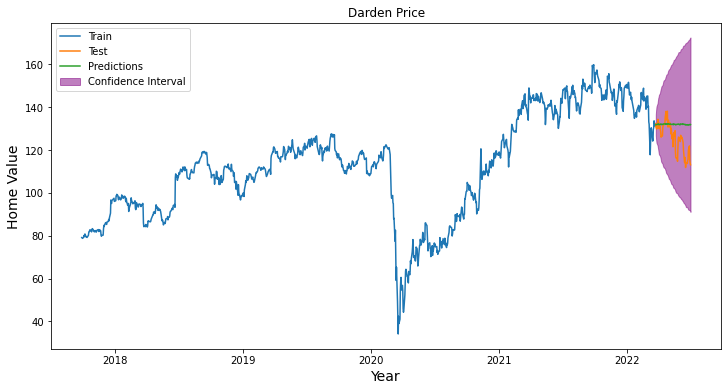

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(1, 1, 0)   Log Likelihood               -3755.370
Date:                Fri, 04 Nov 2022   AIC                           7518.740
Time:                        07:50:42   BIC                           7538.853
Sample:                             0   HQIC                          7526.339
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Dominos        0.1040      0.325      0.320      0.749      -0.533       0.741
deaths        -0.0009      0.001     -1.438      0.150      -0.002       0.000
ar.L1         -0.1052      0.023     -4.632      0.0

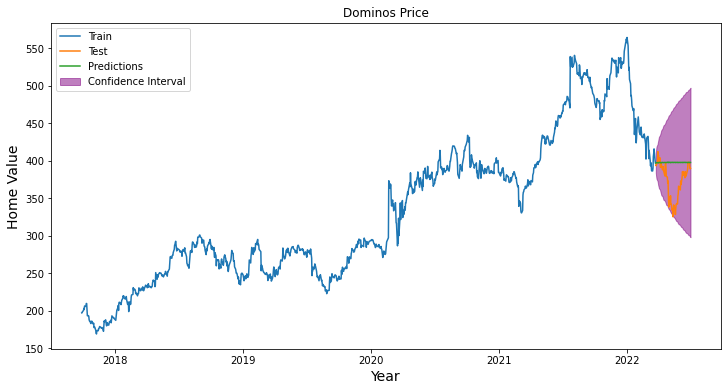

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(1, 1, 0)   Log Likelihood                -733.796
Date:                Fri, 04 Nov 2022   AIC                           1475.591
Time:                        07:50:49   BIC                           1495.704
Sample:                             0   HQIC                          1483.191
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Wendys         0.0941      0.014      6.807      0.000       0.067       0.121
deaths     -1.589e-05   5.59e-05     -0.284      0.776      -0.000    9.36e-05
ar.L1         -0.0921      0.009    -10.614      0.0

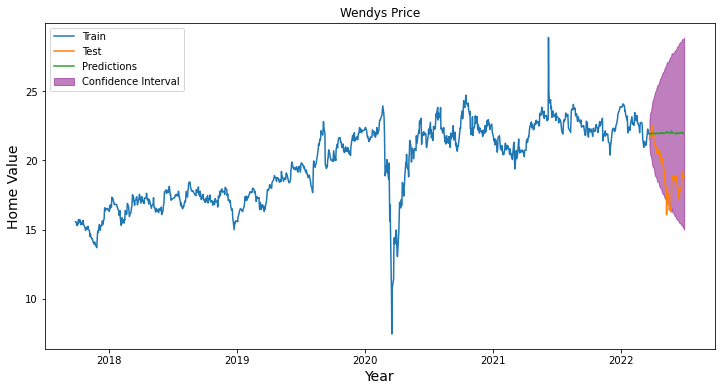

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(1, 1, 0)   Log Likelihood               -2802.906
Date:                Fri, 04 Nov 2022   AIC                           5613.811
Time:                        07:50:55   BIC                           5633.924
Sample:                             0   HQIC                          5621.411
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Wingstop      -0.2575      0.128     -2.016      0.044      -0.508      -0.007
deaths         0.0005      0.000      2.288      0.022    7.29e-05       0.001
ar.L1          0.0682      0.020      3.493      0.0

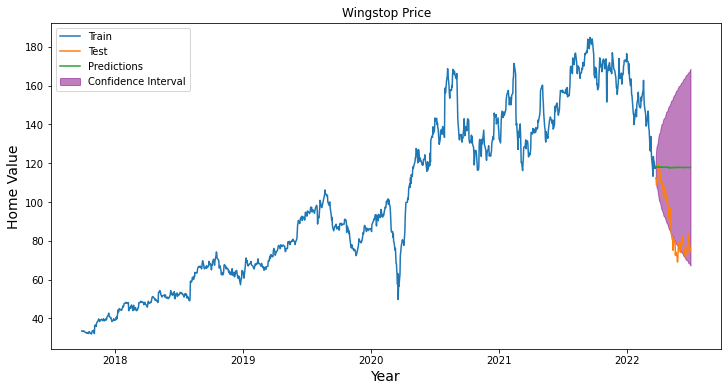

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2333.313
Date:                Fri, 04 Nov 2022   AIC                           4672.626
Time:                        07:50:57   BIC                           4687.711
Sample:                             0   HQIC                          4678.326
                               - 1129                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Papa Johns     0.0331      0.078      0.422      0.673      -0.121       0.187
deaths         0.0002      0.000      1.688      0.091   -3.65e-05       0.000
sigma2         3.6666      0.062     58.849      0.0

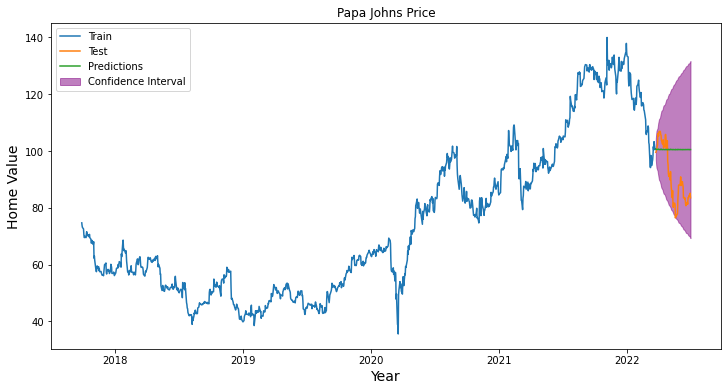

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2880.423
Date:                Fri, 04 Nov 2022   AIC                           5766.845
Time:                        07:50:59   BIC                           5781.930
Sample:                             0   HQIC                          5772.545
                               - 1129                                         
Covariance Type:                  opg                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Cracker Barrel    -0.5413      0.197     -2.750      0.006      -0.927      -0.155
deaths            -0.0003      0.000     -0.972      0.331      -0.001       0.000
sigma2             9.6722      0.207

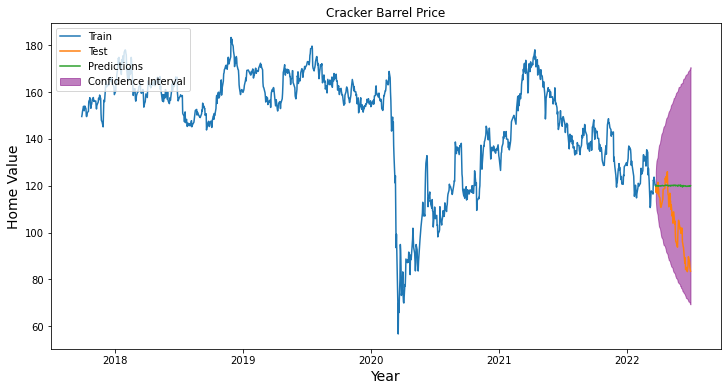

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2559.117
Date:                Fri, 04 Nov 2022   AIC                           5124.235
Time:                        07:51:03   BIC                           5139.319
Sample:                             0   HQIC                          5129.934
                               - 1129                                         
Covariance Type:                  opg                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Shake Shack     0.3814      0.081      4.738      0.000       0.224       0.539
deaths          0.0004      0.000      2.041      0.041    1.46e-05       0.001
sigma2          5.4720      0.096     56.832    

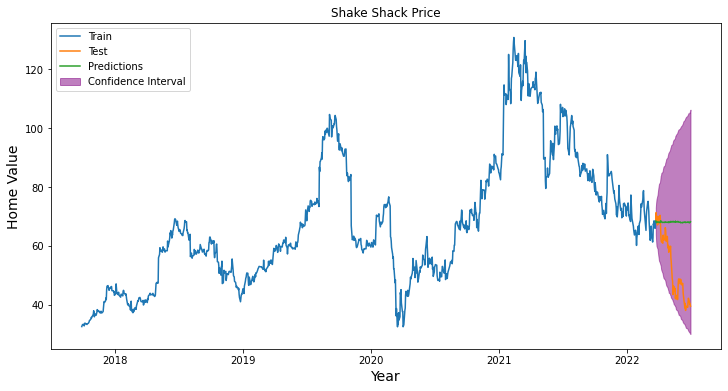

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -971.883
Date:                Fri, 04 Nov 2022   AIC                           1949.765
Time:                        07:51:06   BIC                           1964.850
Sample:                             0   HQIC                          1955.465
                               - 1129                                         
Covariance Type:                  opg                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Bloomin Brands     0.0189      0.028      0.682      0.495      -0.035       0.073
deaths          4.223e-06   5.81e-05      0.073      0.942      -0.000       0.000
sigma2             0.3279      0.007

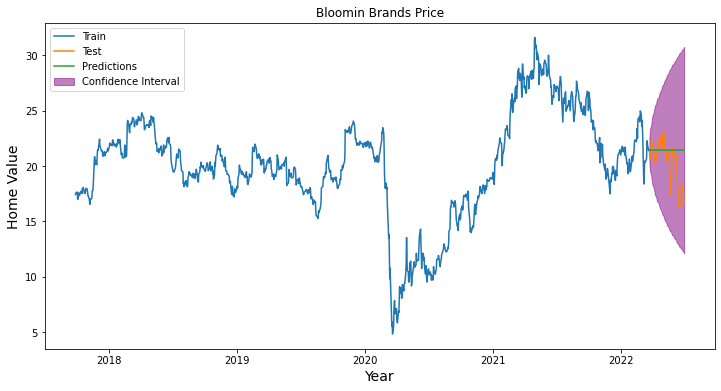

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1129
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -2292.205
Date:                Fri, 04 Nov 2022   AIC                           4590.411
Time:                        07:51:08   BIC                           4605.495
Sample:                             0   HQIC                          4596.110
                               - 1129                                         
Covariance Type:                  opg                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Jack in the Box    -0.0675      0.093     -0.726      0.468      -0.250       0.115
deaths              0.0001      0.000      0.497      0.619      -0.000       0.001
sigma2              3.4087      

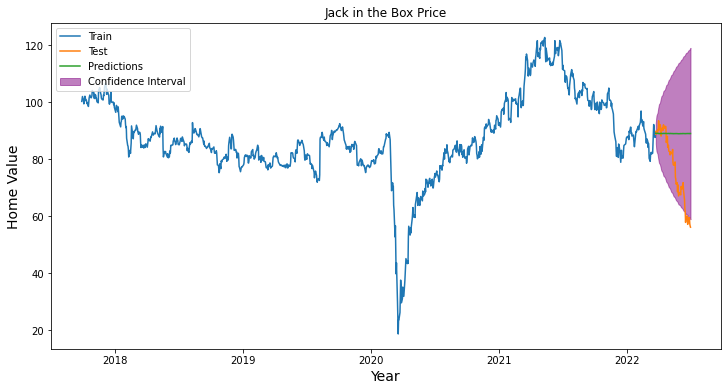

Wall time: 1min 2s


In [48]:
%%time

for x in merged_insample.iloc[:, :14]:
    stonks(merged_insample.iloc[:, :14][x])

stop = timeit.default_timer()

In [49]:
error_dict_percent

{'McDonalds': 3.531687538737728,
 'Starbucks': 13.424791282401568,
 'Chipotle': 14.708718521505995,
 'Yum': 3.3657219152957123,
 'Restaurant Brands Int': 9.594122457229872,
 'Darden': 6.0465700669755265,
 'Dominos': 7.30443334785198,
 'Wendys': 15.067207925721373,
 'Wingstop': 35.00853066531602,
 'Papa Johns': 13.354202243112656,
 'Cracker Barrel': 15.966839919342082,
 'Shake Shack': 34.656865789782366,
 'Bloomin Brands': 7.830470961635871,
 'Jack in the Box': 18.87593339652336}

In [50]:
# Examining the MAPEs by creating a DataFrame of MAPEs
from operator import itemgetter, attrgetter
stocksss_errors= sorted(error_dict_percent.items(), key=itemgetter(0), reverse=True)
pm_stock_diffs_error_per= pd.DataFrame(stocksss_errors)
pm_stock_diffs_error_per.rename( columns={0 :'Stock', 1:'Auto Arima Percent Error'}, inplace=True )


In [51]:
pm_stock_diffs_error_per

,Stock,Auto Arima Percent Error
0,Yum,3.365722
1,Wingstop,35.008531
2,Wendys,15.067208
3,Starbucks,13.424791
4,Shake Shack,34.656866
5,Restaurant Brands Int,9.594122
6,Papa Johns,13.354202
7,McDonalds,3.531688
8,Jack in the Box,18.875933
9,Dominos,7.304433


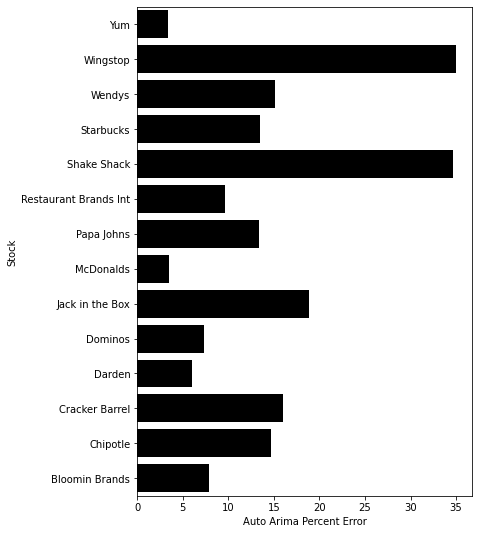

In [52]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='Auto Arima Percent Error',y='Stock', data=pm_stock_diffs_error_per, color="black");

## Sktime Prophet Modeling

Those results were surprisingly good but maybe Prophet can do better. After all, it was developed with the business cycle in mind. Because the regular Prophet module has trouble with exogenous variables, I instead used Sktime's Prophet which does allow for exogenous variables

In [53]:


from sktime.forecasting.fbprophet import Prophet
from sktime.utils.plotting import plot_series
from sktime.utils import plotting
from sktime.performance_metrics.forecasting import     mean_absolute_percentage_error



Next, I will use the Prophet model so I need to reset the index. Therefore, I will make another DataFrame with a reset index

In [54]:
merged_copy_reset=merged_copy.reset_index(drop=False)

merged_copy_reset

,Dates,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,deaths
0,2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,0.0
1,2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,0.0
2,2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,0.0
3,2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,0.0
4,2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1321,2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1322,2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1323,2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1324,2022-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [55]:
prophet_error_dict=dict()
def prophet(data):
    y = data.iloc[:1129]
    test_x=data.iloc[1129 :1198]
    volumex=vol_full[x].to_frame()
    deaths_frame=merged_insample['deaths'].to_frame()
    exog_vars=volumex.merge(deaths_frame, how='left',left_on=volumex.index, right_on=deaths_frame.index)
    exog_vars.drop('key_0', axis=1, inplace=True)
    forecaster = Prophet(freq='d')
    forecaster.fit(y, X=exog_vars.iloc[:1129])
    y_preds = forecaster.predict(fh= np.arange(1, 70), X=exog_vars.iloc[1129:1198, :])
    
    coverage = [0.95]
    y_pred_ints = forecaster.predict_interval(fh=np.arange(1, 70),
                                              X=exog_vars.iloc[1129:1198, :], coverage=0.95)
    y_pred = forecaster.predict(fh= np.arange(1, 70), X=exog_vars.iloc[1129:1198, :])
    print(f'{data.name}  MAPE: %.3f' % (mean_absolute_percentage_error(test_x, y_preds)))
    prophet_percent_error=mean_absolute_percentage_error(test_x, y_preds)*100
    
    fig, ax = plotting.plot_series(y,test_x, y_pred, labels=["Actual Prices", "Test Values","Predicted Prices"])

    ax.fill_between(
    ax.get_lines()[-1].get_xdata(),
    y_pred_ints["Coverage"][0.95]["lower"],
    y_pred_ints["Coverage"][0.95]["upper"],
    alpha=0.6,
    color=ax.get_lines()[-1].get_c(),
    label=f"{coverage} cov.pred.intervals",
    )

    ax.legend();
    
    prophet_error_dict[data.name]=prophet_percent_error


07:51:10 - cmdstanpy - INFO - Chain [1] start processing
07:51:10 - cmdstanpy - INFO - Chain [1] done processing


McDonalds  MAPE: 0.095


07:51:13 - cmdstanpy - INFO - Chain [1] start processing
07:51:14 - cmdstanpy - INFO - Chain [1] done processing


Starbucks  MAPE: 0.275


07:51:16 - cmdstanpy - INFO - Chain [1] start processing
07:51:17 - cmdstanpy - INFO - Chain [1] done processing


Chipotle  MAPE: 0.101


07:51:20 - cmdstanpy - INFO - Chain [1] start processing
07:51:21 - cmdstanpy - INFO - Chain [1] done processing


Yum  MAPE: 0.159


07:51:24 - cmdstanpy - INFO - Chain [1] start processing
07:51:24 - cmdstanpy - INFO - Chain [1] done processing


Restaurant Brands Int  MAPE: 0.092


07:51:27 - cmdstanpy - INFO - Chain [1] start processing
07:51:28 - cmdstanpy - INFO - Chain [1] done processing


Darden  MAPE: 0.254


07:51:30 - cmdstanpy - INFO - Chain [1] start processing
07:51:31 - cmdstanpy - INFO - Chain [1] done processing


Dominos  MAPE: 0.126


07:51:34 - cmdstanpy - INFO - Chain [1] start processing
07:51:34 - cmdstanpy - INFO - Chain [1] done processing


Wendys  MAPE: 0.254


07:51:37 - cmdstanpy - INFO - Chain [1] start processing
07:51:37 - cmdstanpy - INFO - Chain [1] done processing


Wingstop  MAPE: 0.631


07:51:40 - cmdstanpy - INFO - Chain [1] start processing
07:51:41 - cmdstanpy - INFO - Chain [1] done processing


Papa Johns  MAPE: 0.211


07:51:44 - cmdstanpy - INFO - Chain [1] start processing
07:51:44 - cmdstanpy - INFO - Chain [1] done processing


Cracker Barrel  MAPE: 0.379


07:51:47 - cmdstanpy - INFO - Chain [1] start processing
07:51:48 - cmdstanpy - INFO - Chain [1] done processing


Shake Shack  MAPE: 0.540


07:51:50 - cmdstanpy - INFO - Chain [1] start processing
07:51:51 - cmdstanpy - INFO - Chain [1] done processing


Bloomin Brands  MAPE: 0.213


07:51:53 - cmdstanpy - INFO - Chain [1] start processing
07:51:54 - cmdstanpy - INFO - Chain [1] done processing


Jack in the Box  MAPE: 0.117
Wall time: 47 s


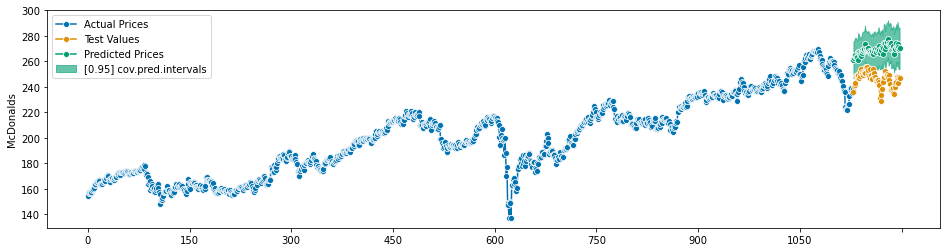

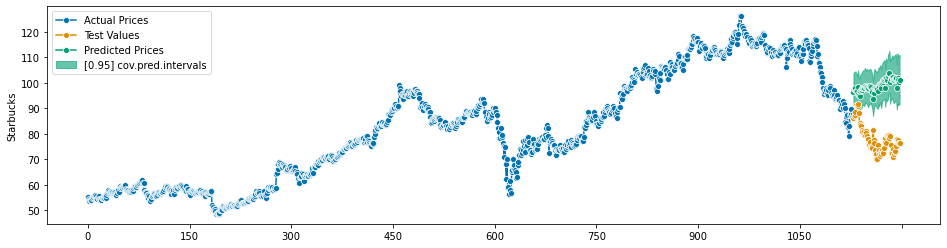

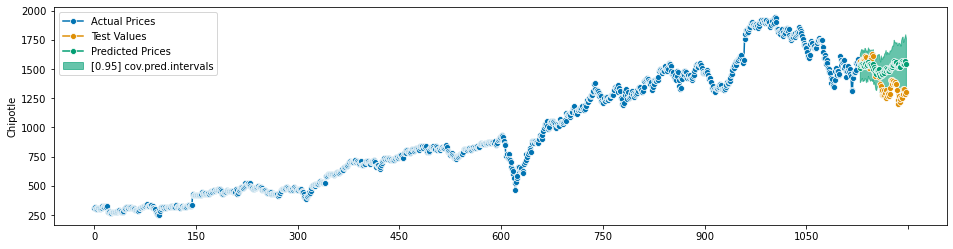

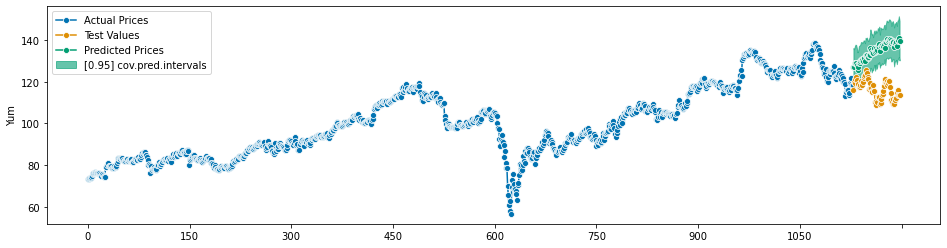

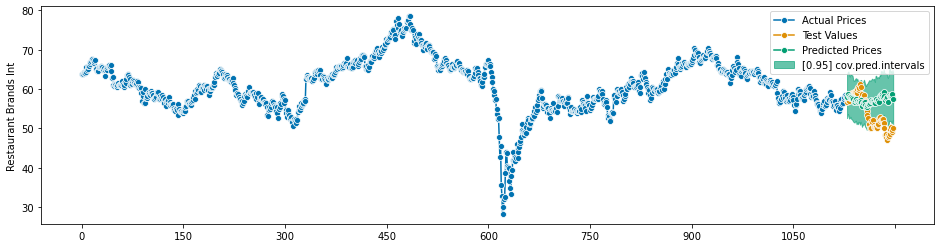

...

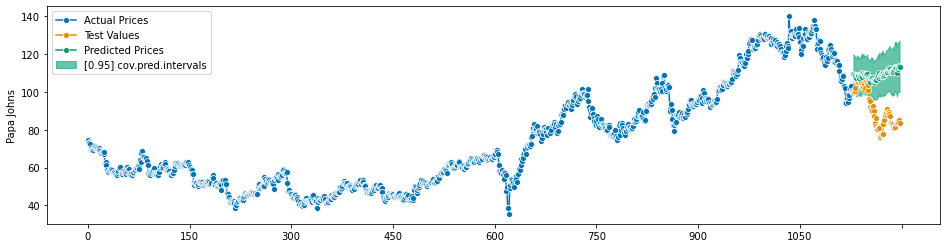

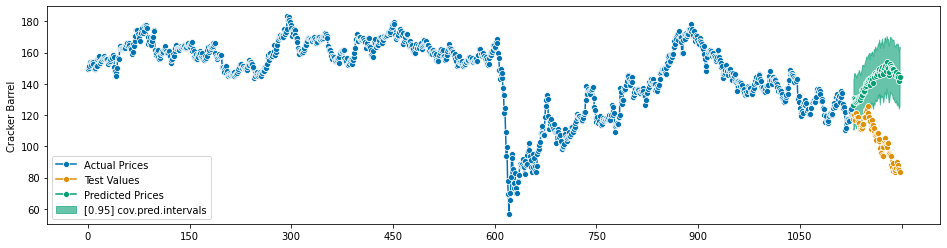

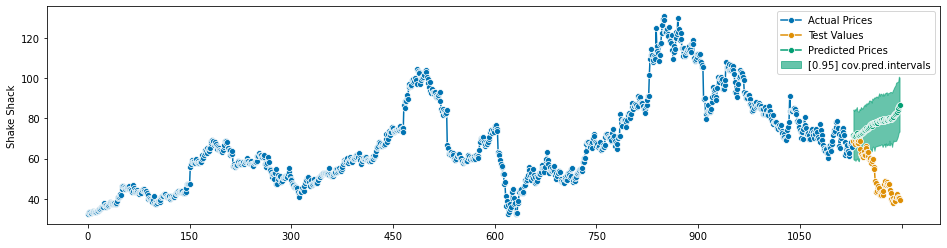

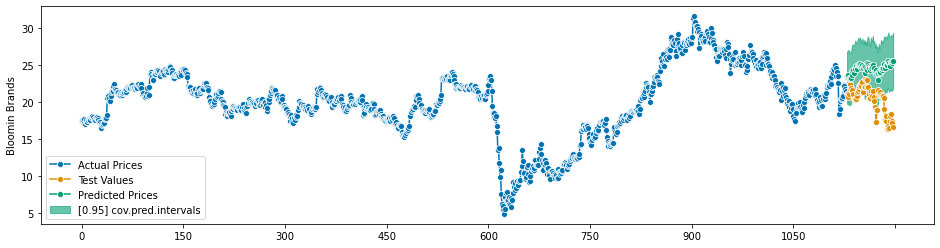

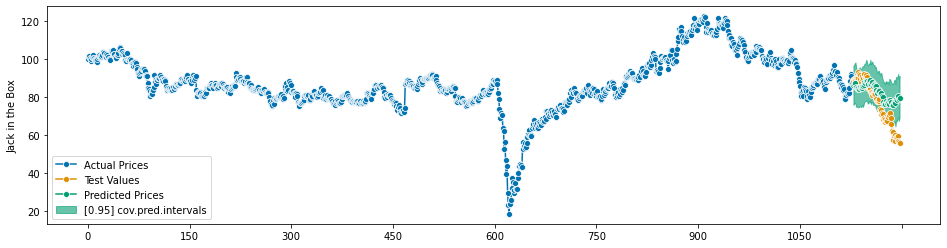

In [56]:
%%time

for x in merged_copy_reset.iloc[:1267, 1:15]:
    prophet(merged_copy_reset.iloc[:1267, 1:15][x])

stop = timeit.default_timer()

In [57]:
prophet_error_dict

{'McDonalds': 9.45541376522143,
 'Starbucks': 27.51159413075075,
 'Chipotle': 10.08578504959042,
 'Yum': 15.934175849046255,
 'Restaurant Brands Int': 9.162873182636687,
 'Darden': 25.424712620481532,
 'Dominos': 12.59629909055368,
 'Wendys': 25.403794623709874,
 'Wingstop': 63.05551633038198,
 'Papa Johns': 21.05623256845318,
 'Cracker Barrel': 37.884868035152955,
 'Shake Shack': 53.97233613877296,
 'Bloomin Brands': 21.316340705509358,
 'Jack in the Box': 11.74329692652412}

In [58]:
#A DataFrame of prophet MAPEs
prophet_errors= sorted(prophet_error_dict.items(), key=itemgetter(0), reverse=False)
pro_stock_diffs_error_per= pd.DataFrame(prophet_errors)
pro_stock_diffs_error_per.rename( columns={0 :'Stock', 1:'Prophet Percent Error'}, inplace=True )
pro_stock_diffs_error_per

,Stock,Prophet Percent Error
0,Bloomin Brands,21.316341
1,Chipotle,10.085785
2,Cracker Barrel,37.884868
3,Darden,25.424713
4,Dominos,12.596299
5,Jack in the Box,11.743297
6,McDonalds,9.455414
7,Papa Johns,21.056233
8,Restaurant Brands Int,9.162873
9,Shake Shack,53.972336


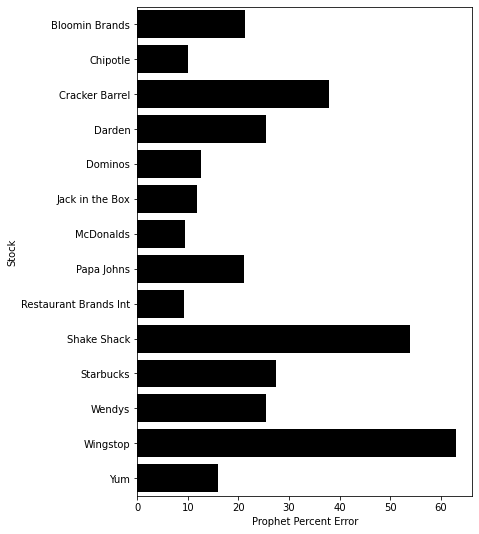

In [59]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='Prophet Percent Error',y='Stock', data=pro_stock_diffs_error_per, color="black");

We can see that the MAPEs are too high to be used. Let's try another model:

# LSTM

First, let's incorporate the death and volume predictions into the data:

In [60]:
death_preds = pd. read_excel ("7day_delay_withmy_preds.xlsx")
death_preds.set_index('ds', inplace=True)
death_preds

,y
ds,
2020-01-23,0.000000
2020-01-24,0.000000
2020-01-25,0.000000
2020-01-26,0.000000
2020-01-27,0.000000
...,...
2022-12-26,1089.821129
2022-12-27,1494.408305
2022-12-28,1611.934845


In [61]:
#Merger of death preds and 
merged_preds=restaurants.merge(death_preds, how='left',left_on=restaurants.index, right_on=death_preds.index)
#merged_preds.fillna(0, inplace=True)
merged_preds.rename(columns={"y": "deaths", "key_0":"Dates"}, inplace=True)
#merged_copy=merged.copy(deep=True)
merged_preds.set_index('Dates', inplace=True)
merged_preds


,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,deaths
Dates,,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,NaN
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,NaN
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,NaN
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,NaN
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1089.821129
2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1494.408305
2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1611.934845


In [62]:
#Opening the death predictions
death_preds = pd.read_excel ("7day_delay_withmy_preds.xlsx")
#Merging with restaurants
full_dataset=restaurants.merge(death_preds, how='left',left_on=restaurants.index, right_on=death_preds['ds'])
#Renaming columns
full_dataset.rename(columns={"y": "deaths", "key_0":"Dates"}, inplace=True)
#Creating a copy before I set index
full_dataset_copy=full_dataset.copy(deep=True)
#Dropping columns
full_dataset.drop('ds', axis=1, inplace=True)
full_dataset.drop('deaths', axis=1, inplace=True)

full_dataset.set_index('Dates', inplace=True)
full_dataset

,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box
Dates,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
full_dataset_copy.iloc[1267:]
#Eliminating nulls
#full_dataset_copy['deaths'].fillna(0, axis=0, inplace=True)
#Setting index
full_dataset_copy.set_index('Dates', inplace=True)
full_dataset_copy

,McDonalds,Starbucks,Chipotle,Yum,Restaurant Brands Int,Darden,Dominos,Wendys,Wingstop,Papa Johns,Cracker Barrel,Shake Shack,Bloomin Brands,Jack in the Box,ds,deaths
Dates,,,,,,,,,,,,,,,,
2017-09-27,154.050003,54.990002,313.850006,73.099998,63.869999,79.150002,196.839996,15.58,33.540001,74.699997,149.550003,32.580002,17.420000,100.199997,NaT,NaN
2017-09-28,157.490005,54.500000,316.529999,73.500000,63.880001,78.959999,197.039993,15.57,33.340000,73.660004,150.399994,32.950001,17.510000,101.040001,NaT,NaN
2017-09-29,156.679993,53.709999,307.829987,73.610001,63.880001,78.779999,198.550003,15.53,33.250000,73.070000,151.619995,33.230000,17.600000,101.919998,NaT,NaN
2017-10-02,156.960007,53.810001,301.809998,73.750000,64.269997,79.169998,199.990005,15.29,33.610001,72.559998,153.899994,33.389999,17.639999,100.589996,NaT,NaN
2017-10-03,156.860001,53.990002,302.989990,73.919998,64.040001,80.110001,202.809998,15.47,33.480000,70.610001,153.210007,33.139999,17.170000,99.339996,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-12-26,1089.821129
2022-12-27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-12-27,1494.408305
2022-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-12-28,1611.934845


Now, I will build and evaluate an LSTM model:

Now, for the LSTM error calculation, I am going to use the average of 3 results. For example, instead of using the result for 1 LSTM on McDonald's stock, I am using the average of 3 results to determine the reliability of the results. **Spoiler: LSTM performed best. I did this many time and LSTM always did well. Therefore, I will use this space to also make predictions.**

Epoch 1/10
113/113 [==============================] - 3s 4ms/step - loss: 6711.9585
Epoch 2/10
113/113 [==============================] - 0s 4ms/step - loss: 2903.3066
Epoch 3/10
113/113 [==============================] - 0s 4ms/step - loss: 972.0126
Epoch 4/10
113/113 [==============================] - 1s 4ms/step - loss: 1319.3756
Epoch 5/10
113/113 [==============================] - 0s 4ms/step - loss: 1287.9098
Epoch 6/10
113/113 [==============================] - 0s 4ms/step - loss: 2651.1855
Epoch 7/10
113/113 [==============================] - 0s 4ms/step - loss: 941.8270
Epoch 8/10
113/113 [==============================] - 0s 4ms/step - loss: 247.8426
Epoch 9/10
113/113 [==============================] - 1s 5ms/step - loss: 138.4350
Epoch 10/10
3/3 [==============================] - 0s 6ms/step
McDonalds equity mape 0.043800665897780776
2/2 [==============================] - 0s 6ms/step
Epoch 1/10
113/113 [==============================] - 3s 4ms/step - loss: 17218.9473
Epoch 

113/113 [==============================] - 1s 5ms/step - loss: 554.4858
Epoch 6/10
113/113 [==============================] - 1s 4ms/step - loss: 1891.9561
Epoch 7/10
113/113 [==============================] - 1s 5ms/step - loss: 374.5748
Epoch 8/10
113/113 [==============================] - 1s 4ms/step - loss: 109.3086
Epoch 9/10
113/113 [==============================] - 1s 5ms/step - loss: 148.2194
Epoch 10/10
3/3 [==============================] - 0s 5ms/step
Wingstop equity mape 0.07584469600131348
2/2 [==============================] - 0s 6ms/step
Epoch 1/10
113/113 [==============================] - 3s 4ms/step - loss: 10036.2568
Epoch 2/10
113/113 [==============================] - 1s 4ms/step - loss: 1115.6384
Epoch 3/10
113/113 [==============================] - 0s 4ms/step - loss: 1486.0081
Epoch 4/10
113/113 [==============================] - 1s 4ms/step - loss: 833.0513
Epoch 5/10
113/113 [==============================] - 1s 4ms/step - loss: 2521.4700
Epoch 6/10
113/113 [

113/113 [==============================] - 1s 4ms/step - loss: 4176.8862
Epoch 10/10
3/3 [==============================] - 0s 7ms/step
Chipotle equity mape 0.05323644763282572
2/2 [==============================] - 0s 6ms/step
Epoch 1/10
113/113 [==============================] - 3s 4ms/step - loss: 5836.5576
Epoch 2/10
113/113 [==============================] - 1s 4ms/step - loss: 2246.9778
Epoch 3/10
113/113 [==============================] - 1s 4ms/step - loss: 911.5946
Epoch 4/10
113/113 [==============================] - 1s 5ms/step - loss: 319.8031
Epoch 5/10
113/113 [==============================] - 1s 5ms/step - loss: 460.0024
Epoch 6/10
113/113 [==============================] - 1s 5ms/step - loss: 497.6381
Epoch 7/10
113/113 [==============================] - 1s 5ms/step - loss: 206.3605
Epoch 8/10
113/113 [==============================] - 1s 6ms/step - loss: 194.8730
Epoch 9/10
113/113 [==============================] - 1s 5ms/step - loss: 824.0149
Epoch 10/10
3/3 [======

Epoch 2/10
113/113 [==============================] - 1s 5ms/step - loss: 963.1992
Epoch 3/10
113/113 [==============================] - 1s 5ms/step - loss: 346.4295
Epoch 4/10
113/113 [==============================] - 1s 5ms/step - loss: 281.1922
Epoch 5/10
113/113 [==============================] - 1s 5ms/step - loss: 122.4467
Epoch 6/10
113/113 [==============================] - 1s 5ms/step - loss: 71.7198
Epoch 7/10
113/113 [==============================] - 1s 5ms/step - loss: 285.0129
Epoch 8/10
113/113 [==============================] - 1s 5ms/step - loss: 80.4435
Epoch 9/10
113/113 [==============================] - 1s 5ms/step - loss: 41.8778
Epoch 10/10
3/3 [==============================] - 0s 7ms/step
Shake Shack equity mape 0.10465841015296473
2/2 [==============================] - 0s 5ms/step
Epoch 1/10
113/113 [==============================] - 3s 4ms/step - loss: 19982.3848
Epoch 2/10
113/113 [==============================] - 1s 5ms/step - loss: 811.4062
Epoch 3/10
11

113/113 [==============================] - 1s 5ms/step - loss: 433.4915
Epoch 7/10
113/113 [==============================] - 1s 5ms/step - loss: 202.8692
Epoch 8/10
113/113 [==============================] - 1s 5ms/step - loss: 358.3730
Epoch 9/10
113/113 [==============================] - 1s 5ms/step - loss: 392.4789
Epoch 10/10
3/3 [==============================] - 0s 5ms/step
Darden equity mape 0.1144871247702457
2/2 [==============================] - 0s 5ms/step
Epoch 1/10
113/113 [==============================] - 3s 5ms/step - loss: 8496.5166
Epoch 2/10
113/113 [==============================] - 1s 4ms/step - loss: 6383.7251
Epoch 3/10
113/113 [==============================] - 1s 5ms/step - loss: 1067.5771
Epoch 4/10
113/113 [==============================] - 1s 5ms/step - loss: 675.6471
Epoch 5/10
113/113 [==============================] - 1s 5ms/step - loss: 747.1982
Epoch 6/10
113/113 [==============================] - 1s 5ms/step - loss: 322.1528
Epoch 7/10
113/113 [======

3/3 [==============================] - 0s 5ms/step
Jack in the Box equity mape 0.08715446805700143
2/2 [==============================] - 0s 5ms/step
Wall time: 5min 59s


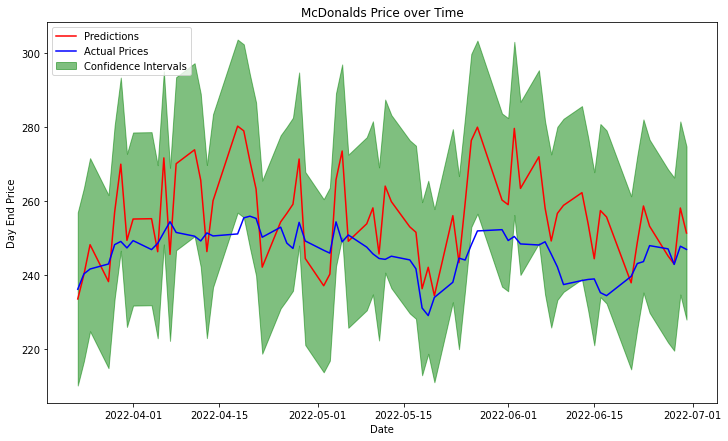

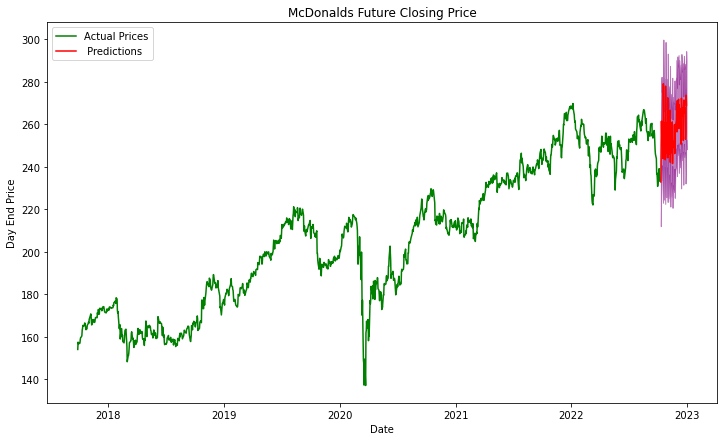

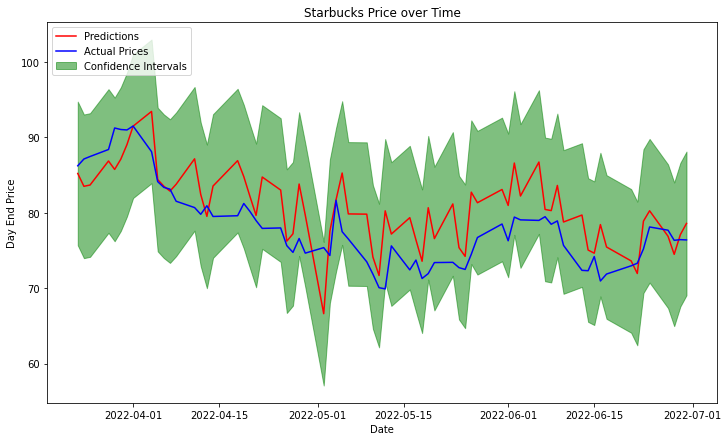

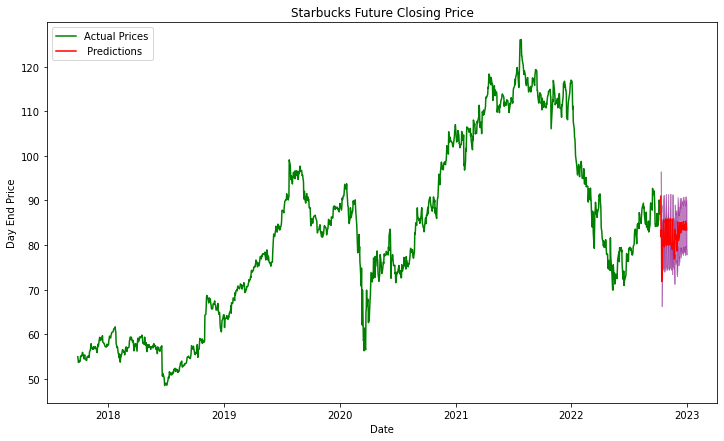

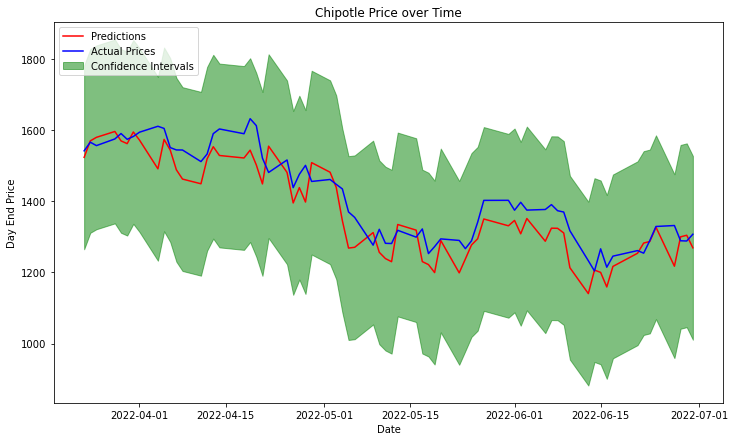

...

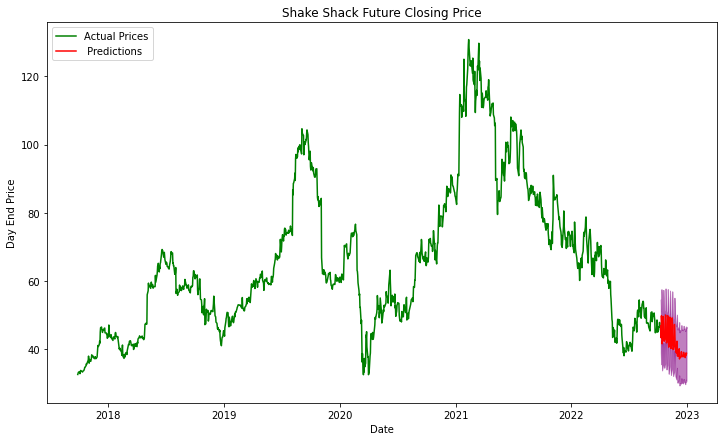

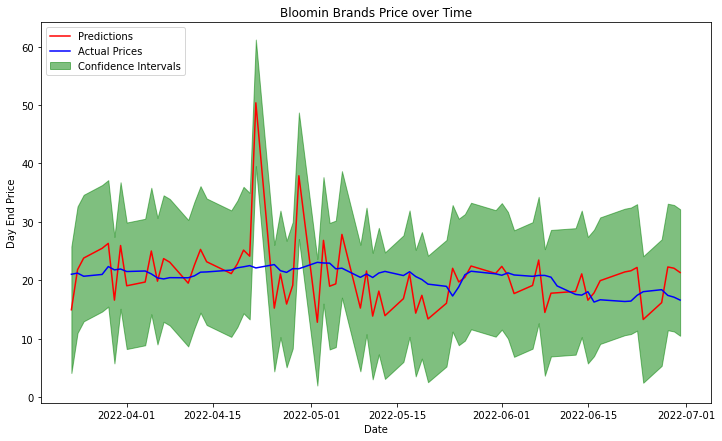

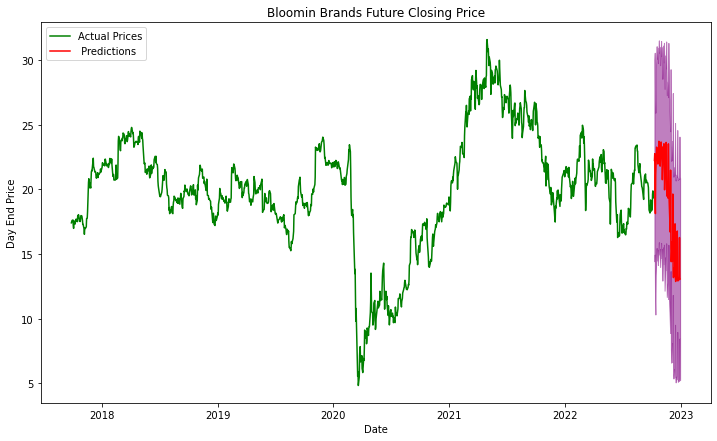

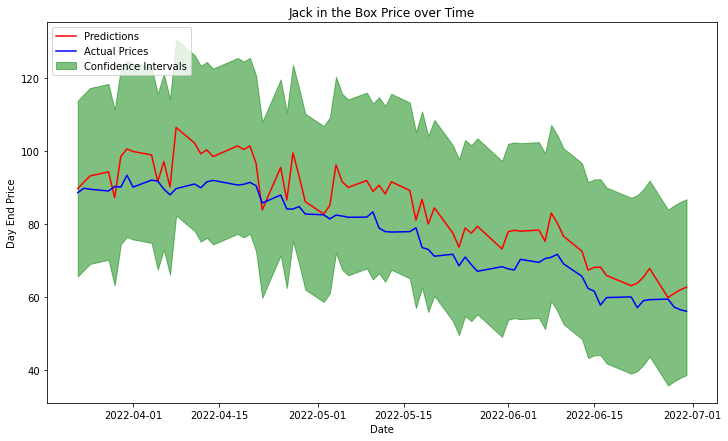

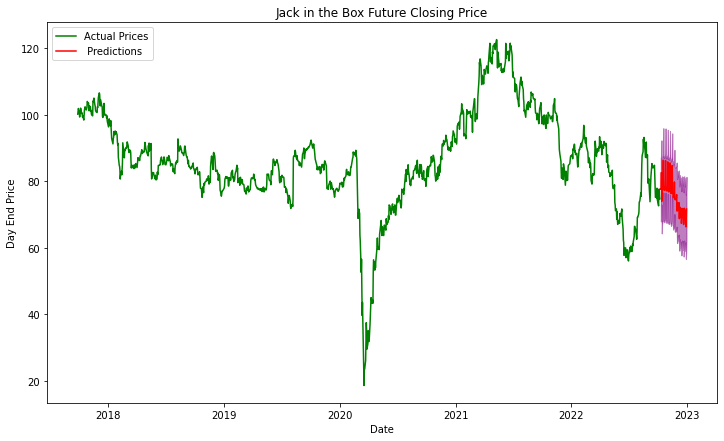

In [64]:
%%time
roi=dict();
profit=[]
profs=[]
death_nums= full_dataset_copy[['deaths']]
stock_error=dict();
mapes=[]
total=[]
loops=3
#This will allow me to do 3 loops. 
for n in range(loops):

    

    for x in full_dataset.iloc[:,:]:
        volumex=vol_full[x].to_frame()
        deaths_frame=full_dataset_copy['deaths'].to_frame()
        exog_vars=volumex.merge(deaths_frame, how='left',left_on=volumex.index, right_on=deaths_frame.index)
        exog_vars.set_index('key_0', inplace=True)      
        #Making a DataFrame that contains only the selected stock and the death numbers
        exogenous_df=exog_vars.merge(merged_copy[x], how='left',left_on=exog_vars.index, right_on=full_dataset.iloc[:,:][x].index)
        exogenous_df.set_index('key_0', inplace=True)
        exogenous_df.fillna(full_dataset.iloc[1190:1265,:][x].mean(), axis=1, inplace=True)

        #Creating training set
        training = exogenous_df.iloc[:1129]

        #"next_" would be properly called a validation set
        next_= exogenous_df.iloc[1129:1200]
        
        future_values= exogenous_df.iloc[1265:]
    
        # Using the create_dataset function to make the DataFrame values into tensors. 
        xtrain, ytrain = create_dataset(training, training.iloc[:,2],2)#Using a lag of 2 to reflect market's responsiveness
        xnext, ynext=create_dataset(next_, next_.iloc[:,2],2)
        xfuture, yfuture=create_dataset(future_values, future_values.iloc[:,2],2)
        model_1 = Sequential()
        model_1.add(LSTM(69,activation='relu', input_shape=(xtrain.shape[1], xtrain.shape[2] )))
        model_1.add(Dense(25))
        model_1.add(Dense(1))
        model_1.compile(loss="mean_squared_error", optimizer="adam")

        model_1.fit(xtrain, ytrain,
                    epochs=10,
                    batch_size=10,
                    verbose=1,
                    shuffle=False
                   )

        ypred = model_1.predict(xnext)
        print(x,'equity mape', (mean_absolute_percentage_error(ypred, next_.iloc[:69,2])))
   
        ypred = asarray(ypred)
        for pred in ypred[:]:
            interval = 1.96 * ypred.std()
            lower, upper = ypred - interval, ypred + interval
        # Remove comments below to see graphs
        plt.figure(figsize=(12,7))
        plt.plot(merged_copy.index[1129:1198], ypred, 'r', label="Predictions")
        plt.plot(merged_copy.index[1129:1198], next_.iloc[:69,2], 'b', label="Actual")
        plt.fill_between(merged_copy.index[1129:1198], lower[:, 0], upper[:, 0], color="green", alpha=0.5)
        plt.xlabel("Date")
        plt.ylabel("Day End Price")
        plt.legend(['Predictions', 'Actual Prices', 'Confidence Intervals'], loc='upper left')    

        plt.title(f'{x} Price over Time')
        
        mape_=mean_absolute_percentage_error(ypred, next_.iloc[:69,2])
        stock_error[x]=mape_

        total.append(stock_error[x])
        mapes.append(total)
        
        ypred_1 = model_1.predict(xfuture)
        ypred_1_array = asarray(ypred_1)
    
        for preds in ypred_1_array[:]:
            interval = 1.96 * ypred_1_array.std()
            lower, upper = ypred_1_array - interval, ypred_1_array + interval

        #Remove comments below to graph each result
        plt.figure(figsize=(12,7))
        plt.plot(merged_copy.index[:1267], full_dataset[x][:1267], 'green', label='Actual Prices')
        plt.plot(merged_copy.index[1267:], ypred_1_array, 'r', label="Predictions")
    
        plt.fill_between(merged_copy.index[1267:], lower[:, 0], upper[:, 0], color="purple", alpha=0.5)
        plt.xlabel("Date")
        plt.ylabel("Day End Price")
        plt.legend([ 'Actual Prices', ' Predictions'], loc='upper left')
        plt.title(f'{x} Future Closing Price')
        
        final_observed=full_dataset[x][1266]
    
        diff=ypred_1[58,0]-full_dataset[x][1266]
        rois=diff/final_observed
        
        roi[x]=rois*100
        profit.append(roi[x])
        profs.append(profit)

       
stop = timeit.default_timer()



In [65]:
# Putting numbers on each MAPE
dicts = {}
length=3
keys = range(length)
values =[total]

nn=dict(list(enumerate(total)))
nn

{0: 0.043800665897780776,
 1: 0.045034681447217166,
 2: 0.03573538983881909,
 3: 0.06336132678391987,
 4: 0.03290855471719825,
 5: 0.06475387948012545,
 6: 0.057664099347105105,
 7: 0.5424349220179832,
 8: 0.07584469600131348,
 9: 0.09633962167978498,
 10: 0.10594189826059486,
 11: 0.16988399002588153,
 12: 0.23396220562472678,
 13: 0.1132050957990985,
 14: 0.03615435644785274,
 15: 0.07803728435933435,
 16: 0.05323644763282572,
 17: 0.07361877199145951,
 18: 0.07173976610912931,
 19: 0.05432268606751645,
 20: 0.025177748537237234,
 21: 0.5760147766784677,
 22: 0.07888187788455017,
 23: 0.09725295732208251,
 24: 0.21525907489743545,
 25: 0.10465841015296473,
 26: 0.4144984264572182,
 27: 0.08844230357106755,
 28: 0.043057719190511774,
 29: 0.14242124292436292,
 30: 0.015940836840472185,
 31: 0.07661459020372678,
 32: 0.1751136670106191,
 33: 0.1144871247702457,
 34: 0.06935494893379257,
 35: 0.2632849143662098,
 36: 0.07575868681832183,
 37: 0.07349239335890626,
 38: 0.1957382271381613

In [66]:
names=[x for x in merged_copy.iloc[:, :14]]
names*3

['McDonalds',
 'Starbucks',
 'Chipotle',
 'Yum',
 'Restaurant Brands Int',
 'Darden',
 'Dominos',
 'Wendys',
 'Wingstop',
 'Papa Johns',
 'Cracker Barrel',
 'Shake Shack',
 'Bloomin Brands',
 'Jack in the Box',
 'McDonalds',
 'Starbucks',
 'Chipotle',
 'Yum',
 'Restaurant Brands Int',
 'Darden',
 'Dominos',
 'Wendys',
 'Wingstop',
 'Papa Johns',
 'Cracker Barrel',
 'Shake Shack',
 'Bloomin Brands',
 'Jack in the Box',
 'McDonalds',
 'Starbucks',
 'Chipotle',
 'Yum',
 'Restaurant Brands Int',
 'Darden',
 'Dominos',
 'Wendys',
 'Wingstop',
 'Papa Johns',
 'Cracker Barrel',
 'Shake Shack',
 'Bloomin Brands',
 'Jack in the Box']

In [67]:
#DataFrame OF LSTM MAPEs
lstm_errors= sorted(nn.items(), key=itemgetter(0), reverse=False)
lstm_errors_per= pd.DataFrame(lstm_errors)
lstm_errors_per.rename( columns={0 :'Stock', 1:'LSTM MAPE'}, inplace=True )
lstm_errors_per['Equity']=names*3
lstm_errors_per['LSTM MAPE']=lstm_errors_per['LSTM MAPE']*100
lstm_errors_per


,Stock,LSTM MAPE,Equity
0,0,4.380067,McDonalds
1,1,4.503468,Starbucks
2,2,3.573539,Chipotle
3,3,6.336133,Yum
4,4,3.290855,Restaurant Brands Int
5,5,6.475388,Darden
6,6,5.766410,Dominos
7,7,54.243492,Wendys
8,8,7.584470,Wingstop
9,9,9.633962,Papa Johns


#  Results

In [68]:
error_means=lstm_errors_per.groupby(['Equity']).mean()
error_means.drop(['Stock'], axis=1, inplace=True)
error_means.reset_index(drop=False, inplace=True)
error_means.rename( columns={'LSTM MAPE' :'Average LSTM MAPE'}, inplace=True )

error_means

,Equity,Average LSTM MAPE
0,Bloomin Brands,27.870799
1,Chipotle,3.497089
2,Cracker Barrel,17.231307
3,Darden,7.785456
4,Dominos,5.073227
5,Jack in the Box,9.626729
6,McDonalds,4.100425
7,Papa Johns,8.902832
8,Restaurant Brands Int,9.325400
9,Shake Shack,11.945758


Ok, I will eliminate any stock that has an Average MAPE over 10% from contention for top 3 and bottom 3 because I can't trust any predictions from them. Therefore, **Bloomin Brands, Cracker Barrel, Shake Shack, and Wendy's are all eliminated**.

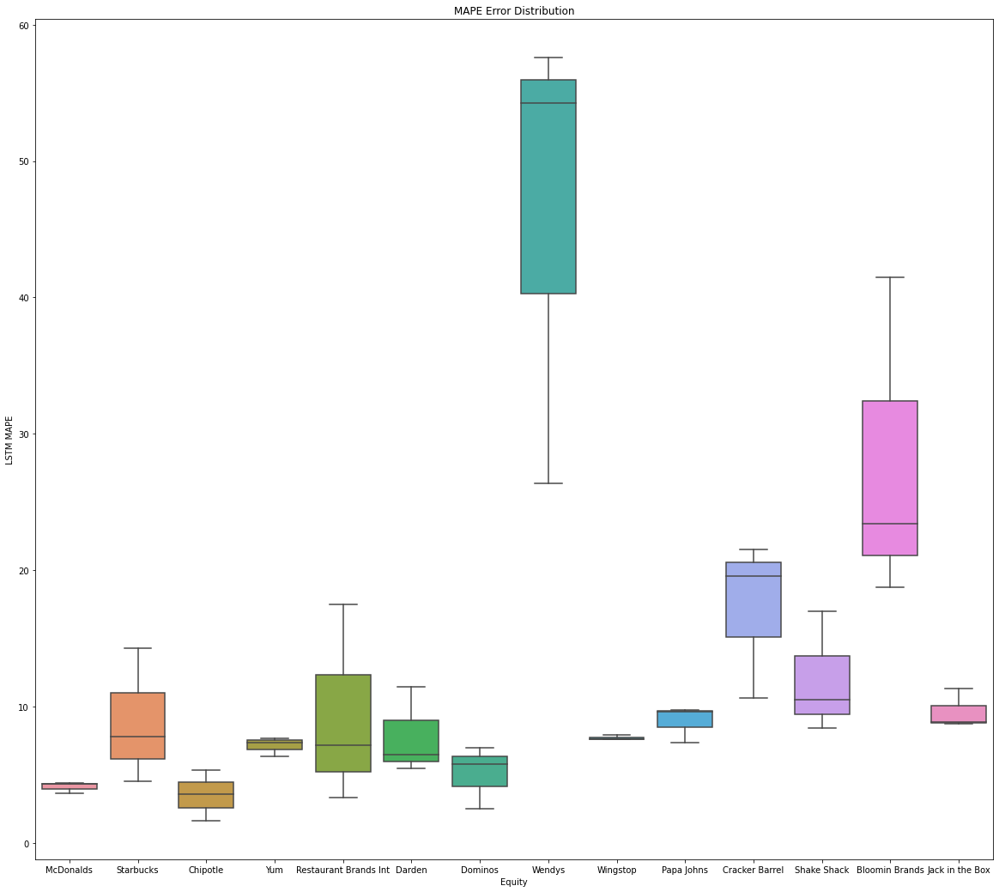

In [69]:
fig, ax = plt.subplots(figsize=(20, 18))
sns.boxplot(data=lstm_errors_per, x='Equity', y='LSTM MAPE')
ax.set_title('MAPE Error Distribution')
plt.show()

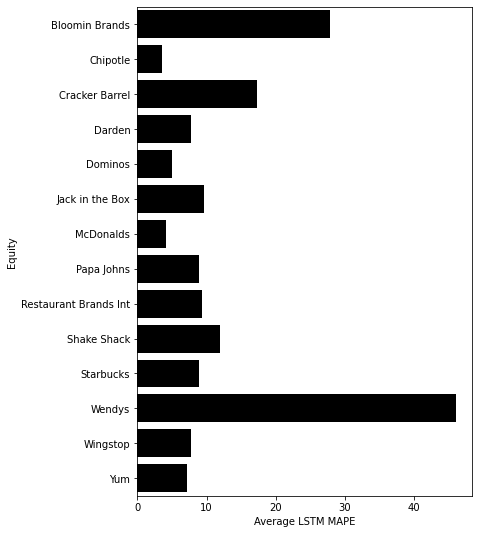

In [70]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='Average LSTM MAPE',y='Equity', data=error_means, color="black");

That's not bad but the outliers really harm the model. Also, different iterations of this model will yield different results because LSTMs are stochastic however I did run this many time and the values are similar. 

Let's evaluate model results to see which is the best to use. I would like to use a Group bar chart so we are going to have to combine all of the error values into a DataFrame.

In [71]:
# The names of the new 'model' columns
pm='Auto.arima'
lstm='LSTM'
prop='Prophet'
# Creating the columns
lstm_errors_per = error_means.assign(model=[lstm for x in range(14)])
pm_stock_diffs_error_per=pm_stock_diffs_error_per.assign(model=[pm for x in range(len(pm_stock_diffs_error_per.index))])
pro_stock_diffs_error_per=pro_stock_diffs_error_per.assign(model=[prop for x in range(len(pro_stock_diffs_error_per.index))])
lstm_errors_per

,Equity,Average LSTM MAPE,model
0,Bloomin Brands,27.870799,LSTM
1,Chipotle,3.497089,LSTM
2,Cracker Barrel,17.231307,LSTM
3,Darden,7.785456,LSTM
4,Dominos,5.073227,LSTM
5,Jack in the Box,9.626729,LSTM
6,McDonalds,4.100425,LSTM
7,Papa Johns,8.902832,LSTM
8,Restaurant Brands Int,9.325400,LSTM
9,Shake Shack,11.945758,LSTM


In [72]:
#Concatenating columns
errors_combined=pd.concat([lstm_errors_per, pm_stock_diffs_error_per,pro_stock_diffs_error_per])
errors_combined.reset_index(drop=False)
errors_combined

,Equity,Average LSTM MAPE,model,Stock,Auto Arima Percent Error,Prophet Percent Error
0,Bloomin Brands,27.870799,LSTM,NaN,NaN,NaN
1,Chipotle,3.497089,LSTM,NaN,NaN,NaN
2,Cracker Barrel,17.231307,LSTM,NaN,NaN,NaN
3,Darden,7.785456,LSTM,NaN,NaN,NaN
4,Dominos,5.073227,LSTM,NaN,NaN,NaN
5,Jack in the Box,9.626729,LSTM,NaN,NaN,NaN
6,McDonalds,4.100425,LSTM,NaN,NaN,NaN
7,Papa Johns,8.902832,LSTM,NaN,NaN,NaN
8,Restaurant Brands Int,9.325400,LSTM,NaN,NaN,NaN
9,Shake Shack,11.945758,LSTM,NaN,NaN,NaN


In [73]:
# Filling the NaNs and adding the error columns together.
errors_combined.fillna(0, inplace=True)
errors_combined['errors']=errors_combined['Average LSTM MAPE']+ errors_combined['Auto Arima Percent Error']+errors_combined['Prophet Percent Error']

errors_combined['Stock'].iloc[:14]=errors_combined['Equity'].iloc[:14]
errors_combined

,Equity,Average LSTM MAPE,model,Stock,Auto Arima Percent Error,Prophet Percent Error,errors
0,Bloomin Brands,27.870799,LSTM,Bloomin Brands,0.000000,0.000000,27.870799
1,Chipotle,3.497089,LSTM,Chipotle,0.000000,0.000000,3.497089
2,Cracker Barrel,17.231307,LSTM,Cracker Barrel,0.000000,0.000000,17.231307
3,Darden,7.785456,LSTM,Darden,0.000000,0.000000,7.785456
4,Dominos,5.073227,LSTM,Dominos,0.000000,0.000000,5.073227
5,Jack in the Box,9.626729,LSTM,Jack in the Box,0.000000,0.000000,9.626729
6,McDonalds,4.100425,LSTM,McDonalds,0.000000,0.000000,4.100425
7,Papa Johns,8.902832,LSTM,Papa Johns,0.000000,0.000000,8.902832
8,Restaurant Brands Int,9.325400,LSTM,Restaurant Brands Int,0.000000,0.000000,9.325400
9,Shake Shack,11.945758,LSTM,Shake Shack,0.000000,0.000000,11.945758


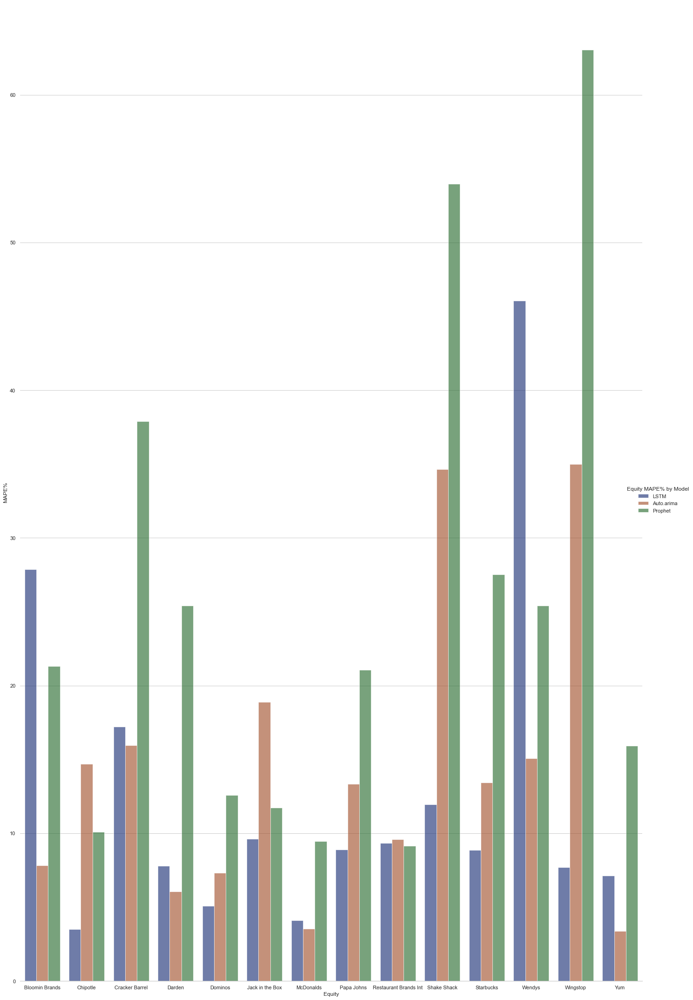

In [74]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.set_theme(style="whitegrid")
#plt.figure(figsize=(30,20))
g = sns.catplot(
data=errors_combined, kind="bar",
x="Stock", y="errors", hue="model",
palette="dark", alpha=.6, height=30, aspect=.65
)
g.despine(left=True)
g.set_axis_labels("Equity", "MAPE%")
g.legend.set_title("Equity MAPE% by Model")

The Auto.Arima model was surprisingly good. However, I will still go with the LSTM model because its performance was better but was harmed by a few serious outliers. I will have to either disregard predictions on those equities or be very cautious when drawing conclusions from them.

In [75]:
dicts = {}
length=14
keys = range(length)
values =[profit]

profits=dict(list(enumerate(profit)))
profits

{0: 15.297357502030264,
 1: -4.092269068159867,
 2: 5.31731986586883,
 3: 10.943842490142028,
 4: -1.4782344969069652,
 5: -5.176422971369911,
 6: 33.22267674253626,
 7: -19.59072033148162,
 8: -12.791269973031893,
 9: 22.007004521791494,
 10: -5.878766760140448,
 11: -4.41021456609167,
 12: 90.90228829502075,
 13: -30.854884118938124,
 14: 10.884538476537374,
 15: -15.473014886771267,
 16: 4.999046170264316,
 17: -9.022835609200008,
 18: -15.444358223324596,
 19: 13.146524932373302,
 20: 22.43601500525603,
 21: 7.009927639786477,
 22: -13.120555164213485,
 23: 34.89599344545695,
 24: -19.121009655634914,
 25: -30.441810018016934,
 26: -1.883937110585612,
 27: -1.6825494160221572,
 28: 17.17556465489515,
 29: 0.6776322499919196,
 30: 6.64080694208905,
 31: 10.63848460638784,
 32: 11.72098266624898,
 33: -11.695618894639091,
 34: 19.382976409240676,
 35: -10.239763908985404,
 36: -11.808973535932504,
 37: 23.83192725562048,
 38: -10.180026680605867,
 39: -16.95757008232072,
 40: -32.493

In [76]:
equity_rois= sorted(profits.items(), key=itemgetter(0), reverse=False)
equity_rois_per= pd.DataFrame(equity_rois)
equity_rois_per.rename( columns={0 :'Stock', 1:'ROI'}, inplace=True )
equity_rois_per['Equity']=names*3
equity_rois_per

,Stock,ROI,Equity
0,0,15.297358,McDonalds
1,1,-4.092269,Starbucks
2,2,5.317320,Chipotle
3,3,10.943842,Yum
4,4,-1.478234,Restaurant Brands Int
5,5,-5.176423,Darden
6,6,33.222677,Dominos
7,7,-19.590720,Wendys
8,8,-12.791270,Wingstop
9,9,22.007005,Papa Johns


In [77]:
roi_means=equity_rois_per.groupby(['Equity']).mean()
roi_means.drop(['Stock'], axis=1, inplace=True)
roi_means.reset_index(drop=False, inplace=True)
roi_means.rename( columns={'ROI':'Average ROI'}, inplace=True )

roi_means

,Equity,Average ROI
0,Bloomin Brands,18.841647
1,Chipotle,5.652391
2,Cracker Barrel,-11.726601
3,Darden,-1.241839
4,Dominos,25.013889
5,Jack in the Box,-12.207559
6,McDonalds,14.452487
7,Papa Johns,26.911642
8,Restaurant Brands Int,-1.733870
9,Shake Shack,-17.269865


**The top 3 were Papa Johns, Dominos, and McDonalds while the bottom 3 were Wingstop, Jack in the Box, and Starbucks.**

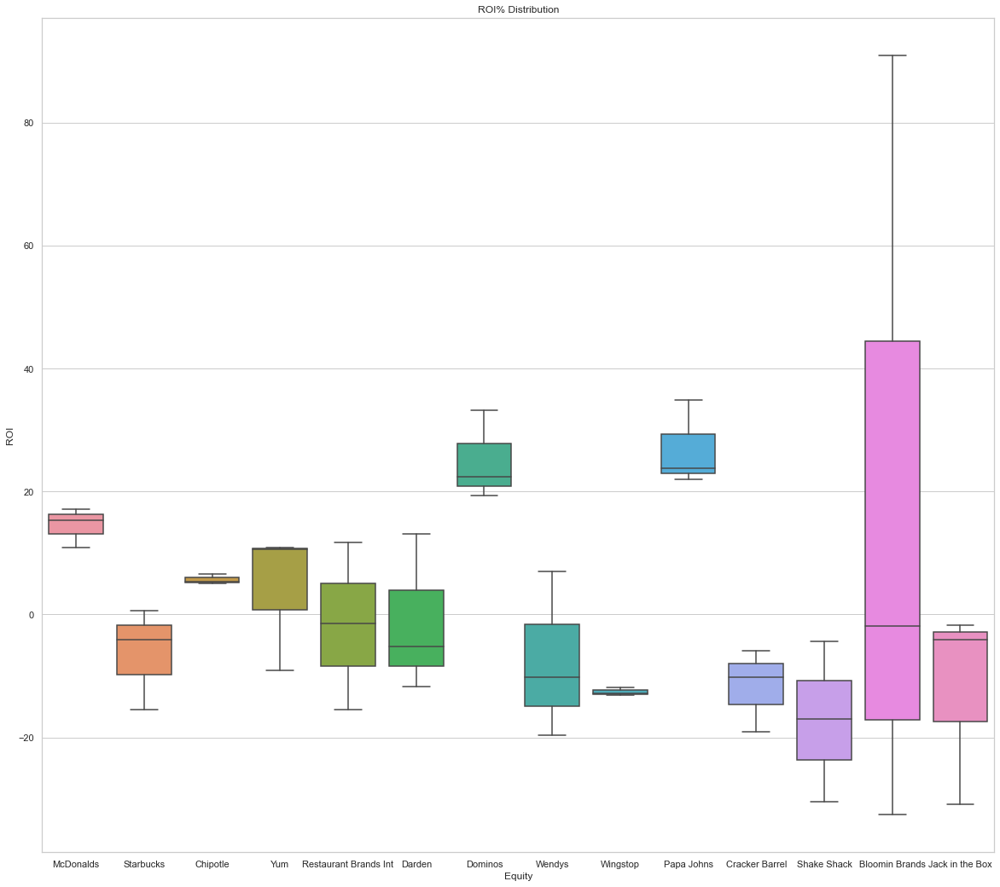

In [78]:
fig, ax = plt.subplots(figsize=(20, 18))
sns.boxplot(data=equity_rois_per, x='Equity', y='ROI')
ax.set_title('ROI% Distribution')
plt.show()

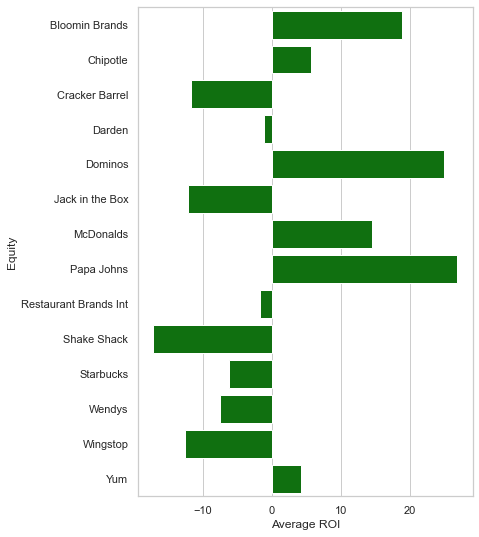

In [79]:
f, ax = plt.subplots(figsize=(6, 9))
sns.barplot(x='Average ROI',y='Equity', data=roi_means, color="green");

Ok, Now, I will make out of sample predictions on the LSTM since it performed the best except for a few outliers.

### TOP 3 PERFORMERS

**The top 3 performers were Papa Johns, Dominos, and McDonalds.**

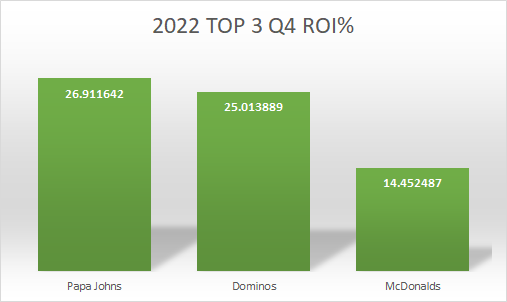

### BOTTOM 3 PERFORMERS

**Here are the bottom 3 performers: Starbucks, Jack in the Box, and Wingstop.**


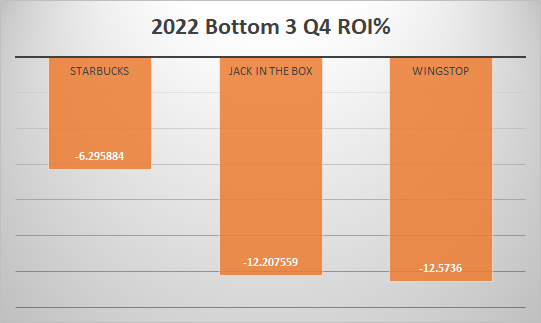

# CONCLUSION

**The top performers were  Papa Johns, Dominos and McDonalds while the bottom 3 were Wingstop, Jack in the Box, and Starbucks.**. The model’s results will help investors hoping for insight into the restaurant industry’s Q4 performance. Especially important in this model is its incorporation of COVID-19 death numbers. Thankfully, my prediction for COVID deaths are probably too high but there are no available datasets available that make better predictions at the same 2.5 month interval. In fact, most predictions only predict for 4 weeks and not on individual days. 

This notebook is a very fruitful start for modeling stock prices. However, some of its assumption could justifiably be questioned. The temporal link between COVID deaths and stock prices is real but the exact amount of time is not entirely clear. In fact, there is good evidence that it is actually much longer than I assume here. Moreover, there is good evidence that in-person dining actually effects COVID rates so these 2 variables could very well be in a feedback loop:

https://journals.lww.com/epidem/fulltext/2022/03000/the_impact_of_keeping_indoor_dining_closed_on.7.aspx

More exogenous variables like real estate prices, commodities prices, inflation rate and interest rates would certainly enhance this dataset and its analysis.

Overall, the model provides a great beginning for modeling stock prices.
